In [3]:
import sys
sys.path.insert(0, '../')
from NE204_Functions import *

from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

from sklearn.mixture import GaussianMixture

In [2]:
data, saturated = import_data('../Lab-1/Data/Combined_Data/Cs137-24in-2.h5')

Checking for Saturation:   0%|          | 0/16145 [00:00<?, ?it/s]

In [3]:
data, saturated = import_data('Data/Test-1021/Strong-Cs137-10sec_1.h5')

In [70]:
uncombined_dir = 'Data/Test-1021/'
uncombined_source = 'Pls'
uncombined_data = [uncombined_dir+f for f in os.listdir(uncombined_dir) if f != '.DS_Store' and uncombined_source in f]

file_name = '-'.join(uncombined_data[0].split('/')[-1].split('_')[0].split('-')[:-1])

datas = []
for i, file in enumerate(tqdm(uncombined_data, desc='Combining Files')):
    f = h5py.File(file, 'r')
    data_np = np.array(f['raw_data'])
    time_event, unique_times = np.unique(np.array(f['event_data']['timestamp']), return_index=True)
    
    data_np_crop = data_np[unique_times]
    
    datas.append(data_np_crop)
merge_data = np.concatenate(datas)

fmerged = h5py.File('Data/Combined_Data/{}-{}.h5'.format(file_name, i+1), 'w')
fmerged.create_dataset('raw_data', data=merge_data)

fmerged.close()

Combining Files:   0%|          | 0/6 [00:00<?, ?it/s]

In [4]:
data_old, saturated = import_data('../Lab-1/Data/Combined_Data/Uncombined_Data/Co60-36in-1min_1.h5')

In [5]:
data_new, saturated = import_data('Data/Combined_Data/Pls-Be-Alive-6.h5')

In [64]:
len(data)

6096

In [6]:
energies_old, energies_inds = calibrate_pulses(data_old, return_inds=True)

Creating spectra:   0%|          | 0/10149 [00:00<?, ?it/s]

In [7]:
energies_new = calibrate_pulses(data_new)

Creating spectra:   0%|          | 0/11719 [00:00<?, ?it/s]

Index 367 failed to fit or create trapezoid
Index 523 failed to fit or create trapezoid
Index 669 failed to fit or create trapezoid
Index 1026 failed to fit or create trapezoid
Index 1204 failed to fit or create trapezoid
Index 1734 failed to fit or create trapezoid
Index 1866 failed to fit or create trapezoid
Index 2330 failed to fit or create trapezoid
Index 2460 failed to fit or create trapezoid
Index 3033 failed to fit or create trapezoid
Index 3148 failed to fit or create trapezoid
Index 3789 failed to fit or create trapezoid
Index 3932 failed to fit or create trapezoid
Index 3942 failed to fit or create trapezoid
Index 4812 failed to fit or create trapezoid
Index 4913 failed to fit or create trapezoid
Index 5495 failed to fit or create trapezoid
Index 5888 failed to fit or create trapezoid
Index 6269 failed to fit or create trapezoid
Index 6711 failed to fit or create trapezoid
Index 8321 failed to fit or create trapezoid
Index 9055 failed to fit or create trapezoid
Index 9708 fa

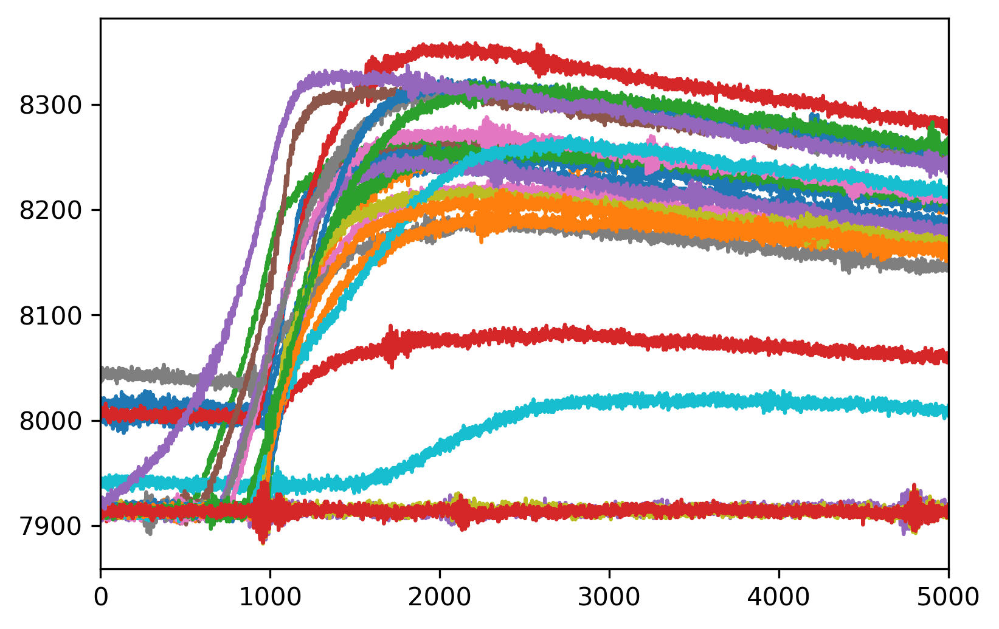

In [77]:
for i in range(25):
    if i not in saturated:
        plt.plot(data_new[i]) #, alpha=0.5)
plt.xlim(0, 5000)
plt.show()

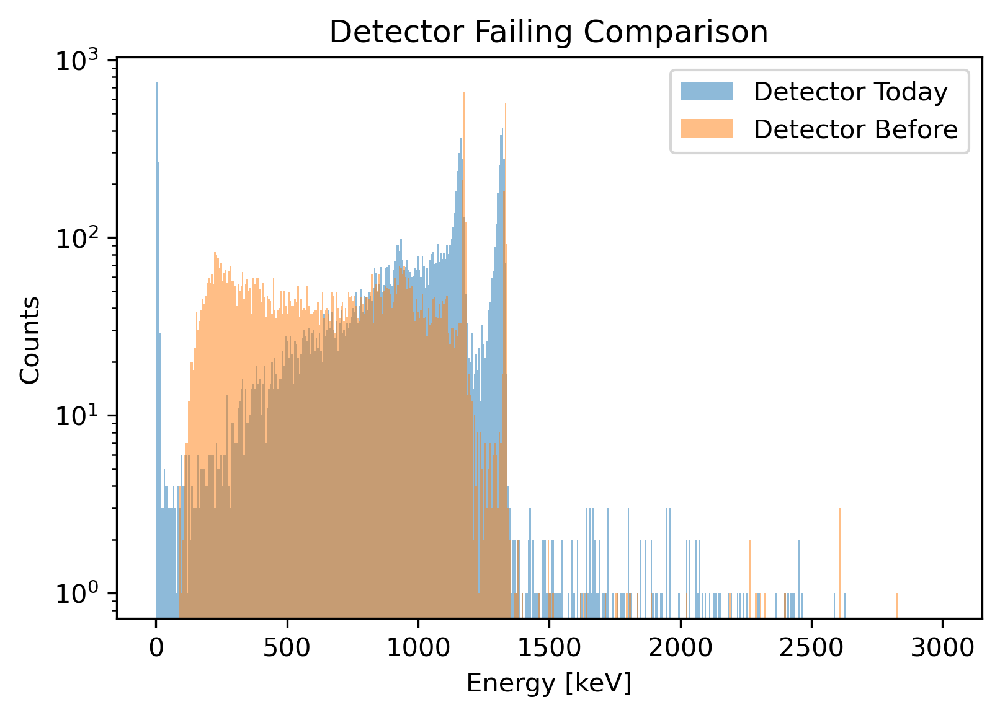

In [8]:
bins_ = np.linspace(0,3000,2**9+1)
plt.hist(energies_new, bins=bins_, alpha=0.5, label='Detector Today')
plt.hist(energies_old, bins=bins_, alpha=0.5, label='Detector Before')
plt.legend()
plt.semilogy()
plt.title('Detector Failing Comparison')
plt.ylabel('Counts')
plt.xlabel('Energy [keV]')
plt.savefig('Plots/old-dead-comparison.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

In [ ]:
energies_pp = calibrate_pulses(data[cs_photopeak_inds])

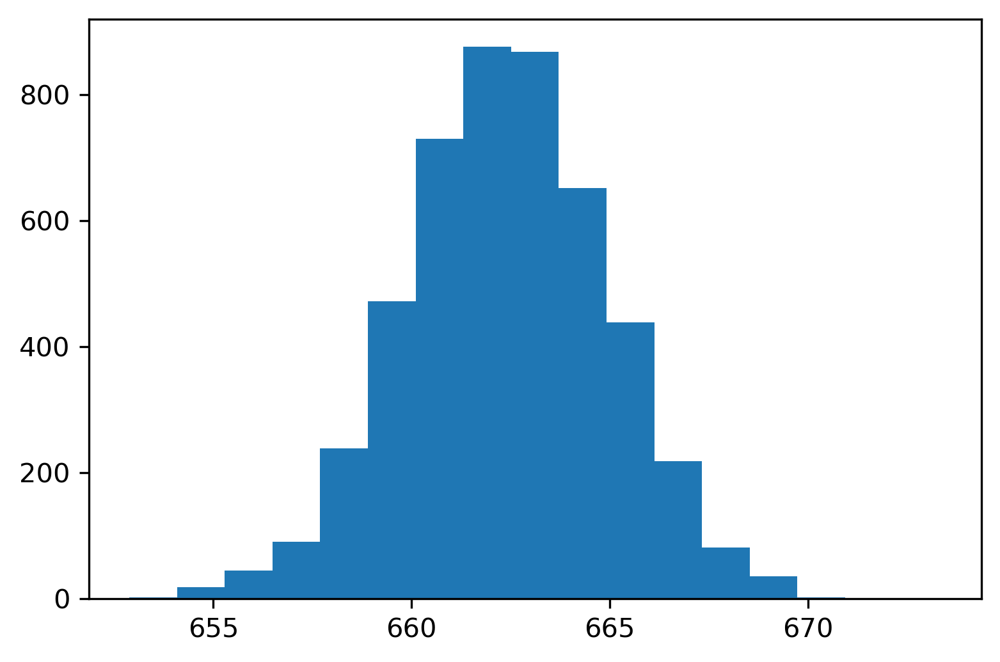

In [127]:
plt.hist(energies_pp, bins=17)
plt.show()

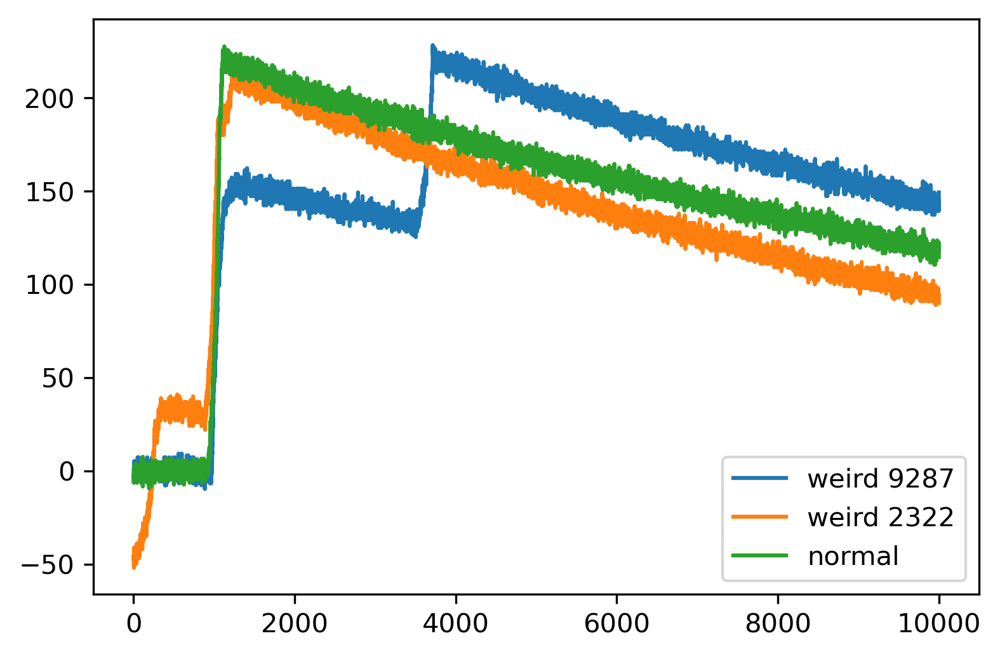

In [122]:
end = 10000
plt.plot(reset_zero(cs_photopeak[2775][:end]), label='weird {}'.format(cs_photopeak_inds[2775]))
plt.plot(reset_zero(cs_photopeak[703][:end]), label='weird {}'.format(cs_photopeak_inds[703]))
plt.plot(reset_zero(cs_photopeak[2][:end]), label='normal')
plt.legend()
plt.show()

In [7]:
rise_times = []
for d in tqdm(data):
    signal = savgol_filter(d[:2500], 51, 0)
    rise_times.append(CFD(signal, 0.9)-CFD(signal, 0.1))
rise_times = np.array(rise_times)

rise_times_photopeak = []
for i in tqdm(cs_photopeak_inds):
    signal = savgol_filter(data[i[0]][:2500], 51, 0)
    rise_times_photopeak.append(CFD(signal, 0.9)-CFD(signal, 0.1))
rise_times_photopeak = np.array(rise_times_photopeak)

  0%|          | 0/16991 [00:00<?, ?it/s]

  0%|          | 0/5028 [00:00<?, ?it/s]

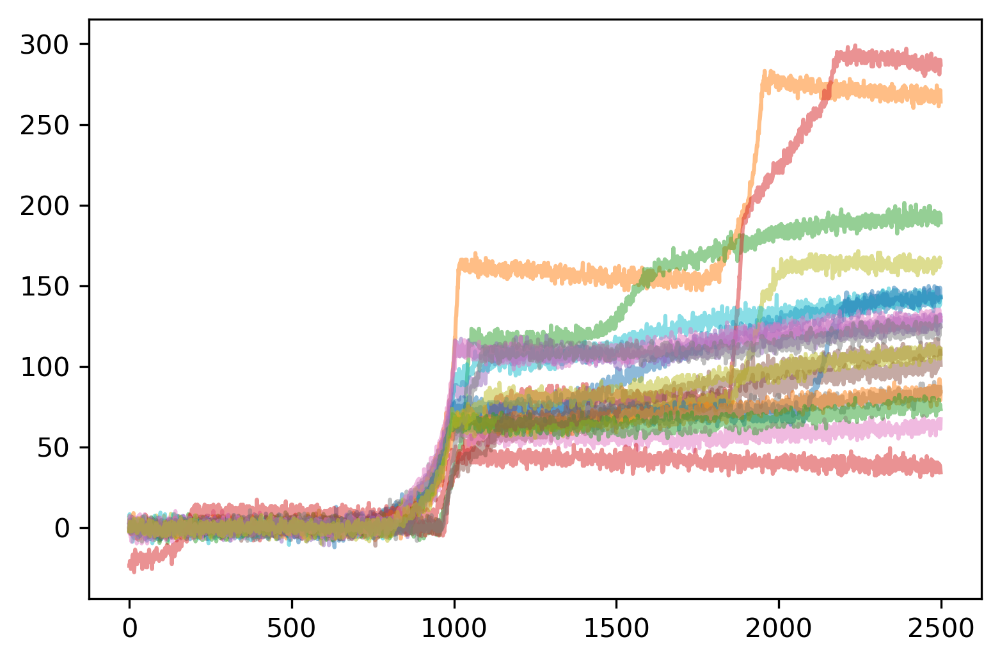

In [61]:
for i in [cs_photopeak_inds[i[0]][0] for i in np.argwhere(rise_times_photopeak > 800)]:
    plt.plot(reset_zero(data[i][:2500]), alpha=0.5)

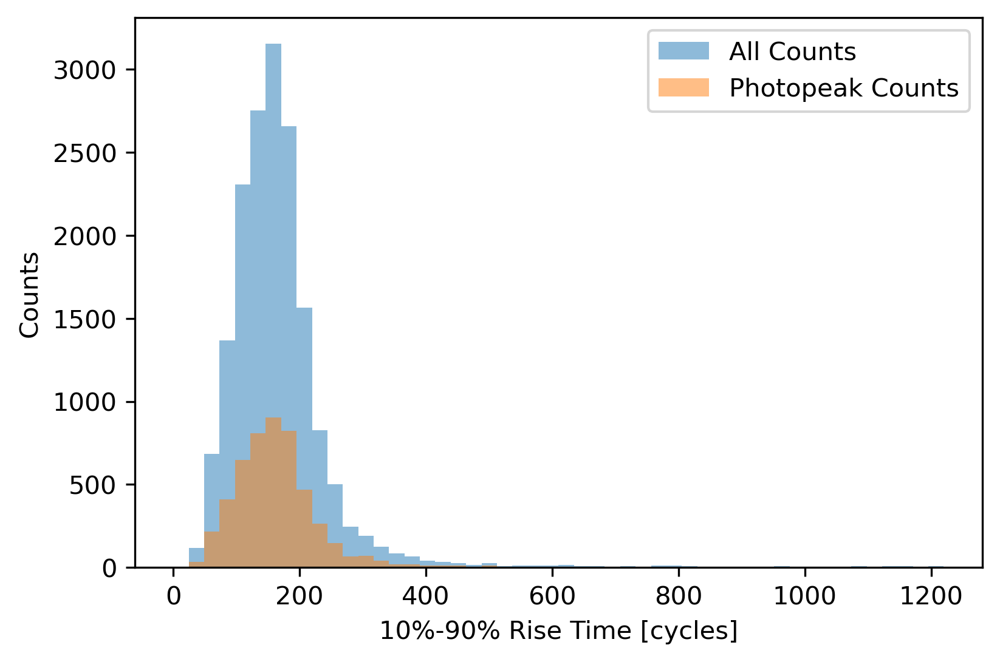

In [8]:
bins = np.linspace(0, 1220, 51)
plt.hist(rise_times, bins=bins, alpha=0.5, label='All Counts')
plt.hist(rise_times_photopeak, bins=bins, alpha=0.5, label='Photopeak Counts')
plt.ylabel('Counts')
plt.xlabel('10%-90% Rise Time [cycles]')
plt.legend()
plt.show()

In [20]:
cs_photopeak_zero, inds = [], []
for p in tqdm(range(len(cs_photopeak))):
    try:
        start = determine_rise(savgol_filter(cs_photopeak[p][:2200], 51, 0))
        #sig = savgol_filter(reset_zero(cs_photopeak[p][start:start+1100]), 51, 0)
        sig = reset_zero(cs_photopeak[p][start:start+1100], samp_size=50)
        cs_photopeak_zero.append(sig/max(sig))
        inds.append(p)
    except:
        pass
inds = np.array(inds)
cs_photopeak_zero = np.array(cs_photopeak_zero)

  0%|          | 0/4800 [00:00<?, ?it/s]

In [36]:
len(cs_photopeak_zero)

4799

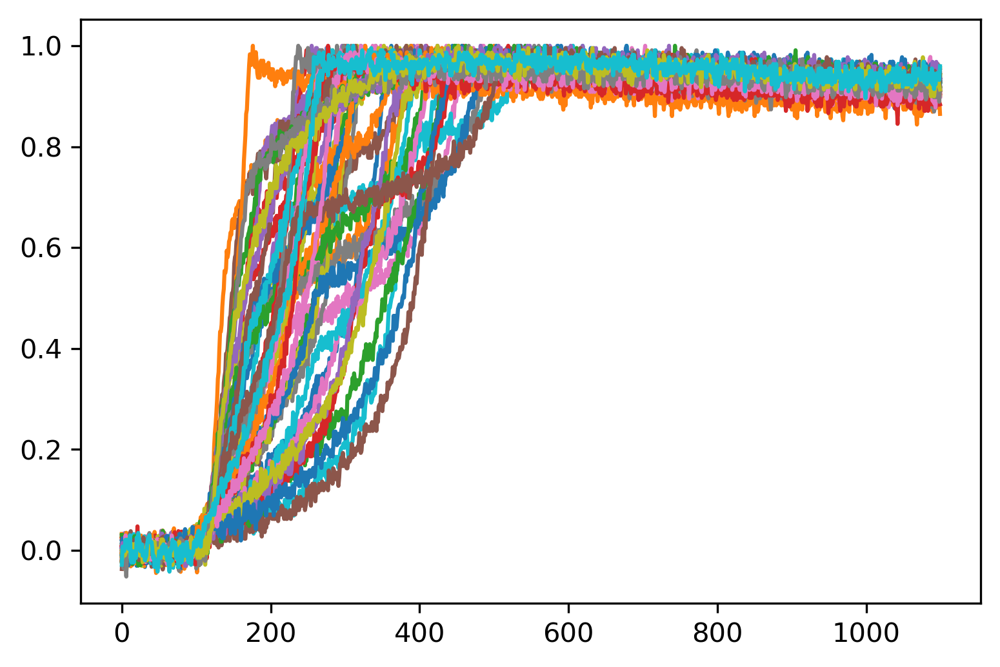

In [21]:
for i in range(50):
    plt.plot(cs_photopeak_zero[i])

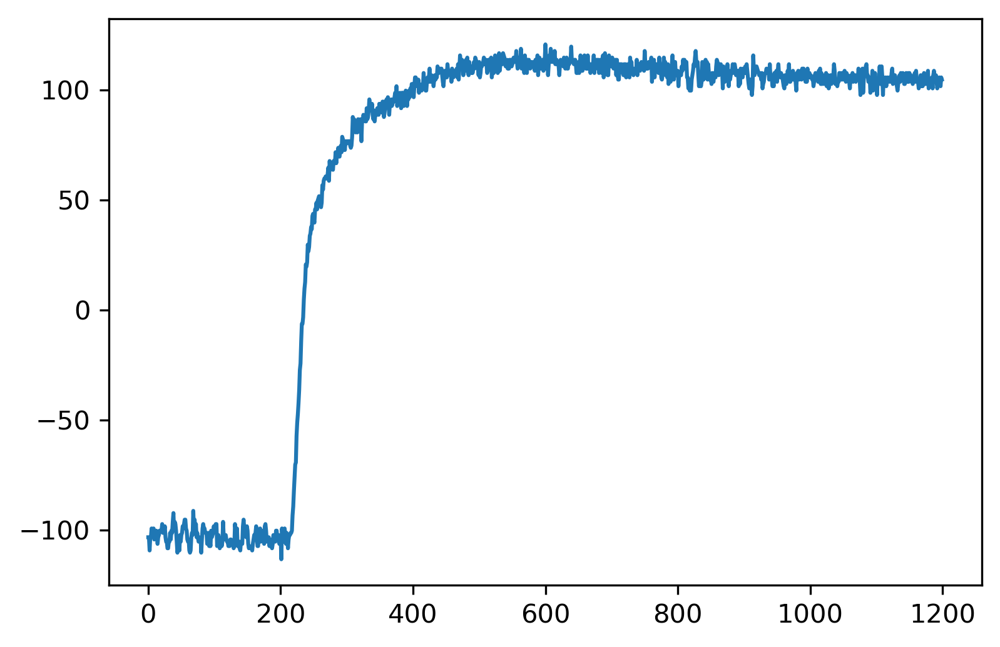

In [21]:
p = 1
start = determine_rise(savgol_filter(cs_photopeak[p][:2200], 51, 0))
plt.plot(reset_zero(cs_photopeak[p][start-100:start+1100]))

Text(0.5, 1.0, '15 Clusters\nRed = Gaussian Mixture\nBlue = K Means')

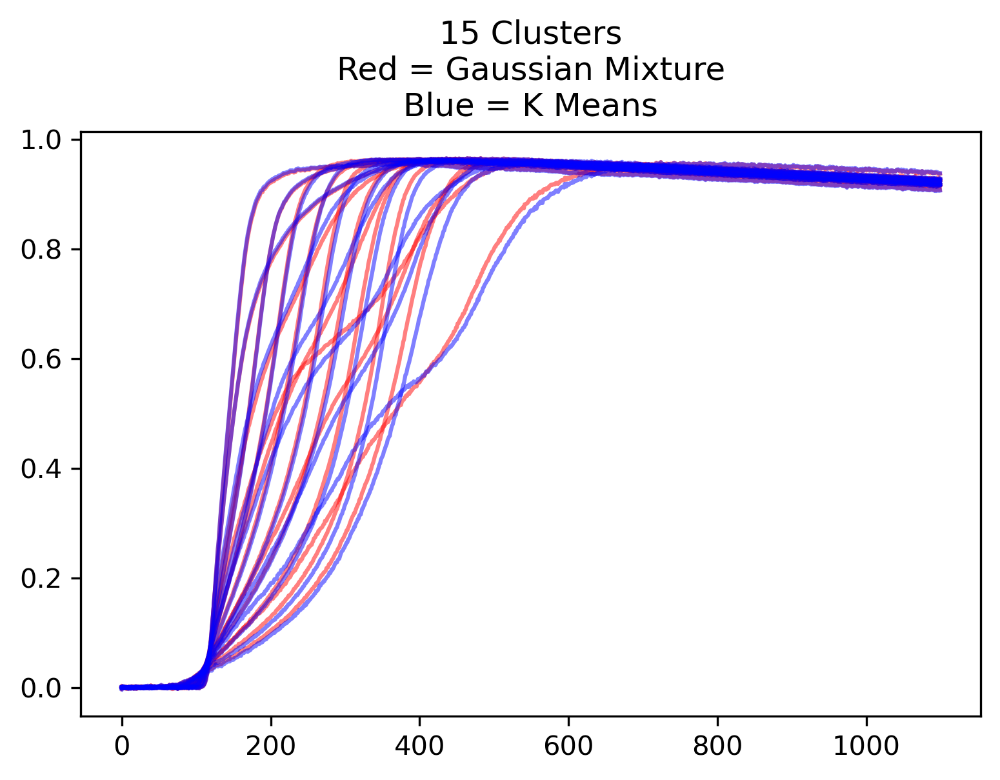

In [43]:
for k in range(n):
    plt.plot(gmm.means_[k], color='red', alpha=0.5)
for k in range(n):
    plt.plot(kmeans.cluster_centers_[k], color='blue', alpha=0.5)
plt.title('{} Clusters\nRed = Gaussian Mixture\nBlue = K Means'.format(n))

In [45]:
gmm.converged_

True

## Clustering

In [4]:
data, sat = import_data('../Lab-1/Data/Combined_Data/Cs137-24in-2.h5')
energies, energies_inds = import_lab1_energies('Cs137', indexes=True)
#energies_old, energies_inds_old = import_lab1_energies('Cs137', indexes=True, new=False)

Checking for Saturation:   0%|          | 0/16145 [00:00<?, ?it/s]

Loading in calibrated Cs137 spectra


In [5]:
cs_photopeak_inds = np.argwhere((energies>=652) & (energies<=670))
cs_photopeak_inds = cs_photopeak_inds.reshape(len(cs_photopeak_inds),)
cs_photopeak_inds = energies_inds[cs_photopeak_inds]

cs_photopeak = np.copy(data[cs_photopeak_inds])

In [6]:
cs_photopeak_zero, inds = [], []
for p in tqdm(range(len(cs_photopeak))):
    try:
        start = determine_rise(savgol_filter(cs_photopeak[p][:2200], 51, 0))
        #start = CFD(cs_photopeak[p][:2200], 0.025, samp_size=50)-250
        #sig = savgol_filter(reset_zero(cs_photopeak[p][start:start+1100]), 51, 0)
        sig = reset_zero(cs_photopeak[p][start:start+1100], samp_size=50)
        cs_photopeak_zero.append(sig/max(sig))
        inds.append(p)
    except:
        print('Index {} failed for some reason?'.format(p))
        pass
inds = np.array(inds)
cs_photopeak_zero = np.array(cs_photopeak_zero)

  0%|          | 0/4547 [00:00<?, ?it/s]

Index 662 failed for some reason?


In [7]:
rise_times = []
for pp in tqdm(range(len(cs_photopeak_zero))):
    signal = savgol_filter(cs_photopeak_zero[pp], 31, 0)
    rise_times.append(CFD(signal, 0.9, samp_size=50)-CFD(signal, 0.1, samp_size=50))

  0%|          | 0/4546 [00:00<?, ?it/s]

In [6]:
kmeans_avg_values, inertia, inves = [], [], range(1, 101, 1)
for n in tqdm(inves):
    test = cluster_data(cs_photopeak_zero, n, quality=True)
    kmeans_avg_values.append(test[0])
    inertia.append(test[1])
kmeans_avg_values = np.array(kmeans_avg_values)
inertia = np.array(inertia)

  0%|          | 0/100 [00:00<?, ?it/s]

9


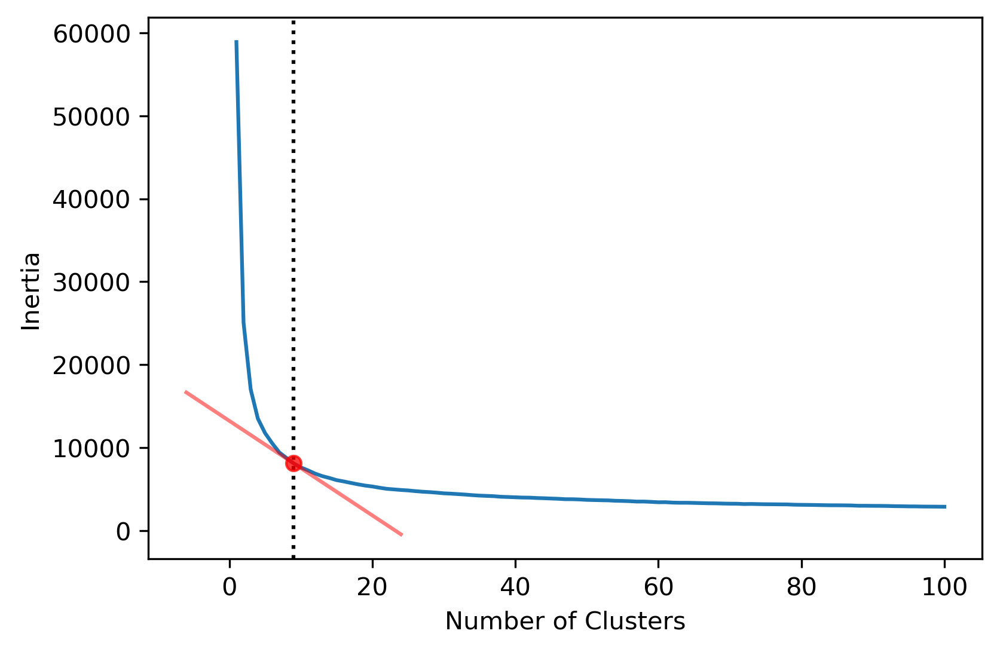

In [7]:
kl = KneeLocator(inves, inertia, curve="convex", direction="decreasing")

print(kl.knee)

plt.plot(inves, inertia)
plt.axvline(kl.knee, color='black', linestyle=':')
xt, yt = tangent_line(inves, inertia, kl.knee, width=30)
plt.plot(xt, yt, alpha=0.5, color='red', zorder=2)
plt.scatter(kl.knee, inertia[inves.index(kl.knee)], zorder=2, color='red', alpha=0.75)
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
#plt.title('Cluster Fitting Error')
plt.savefig('Plots/cluster_inertia_final.png', bbox_inches='tight', facecolor='white', dpi=300)
plt.show()

10


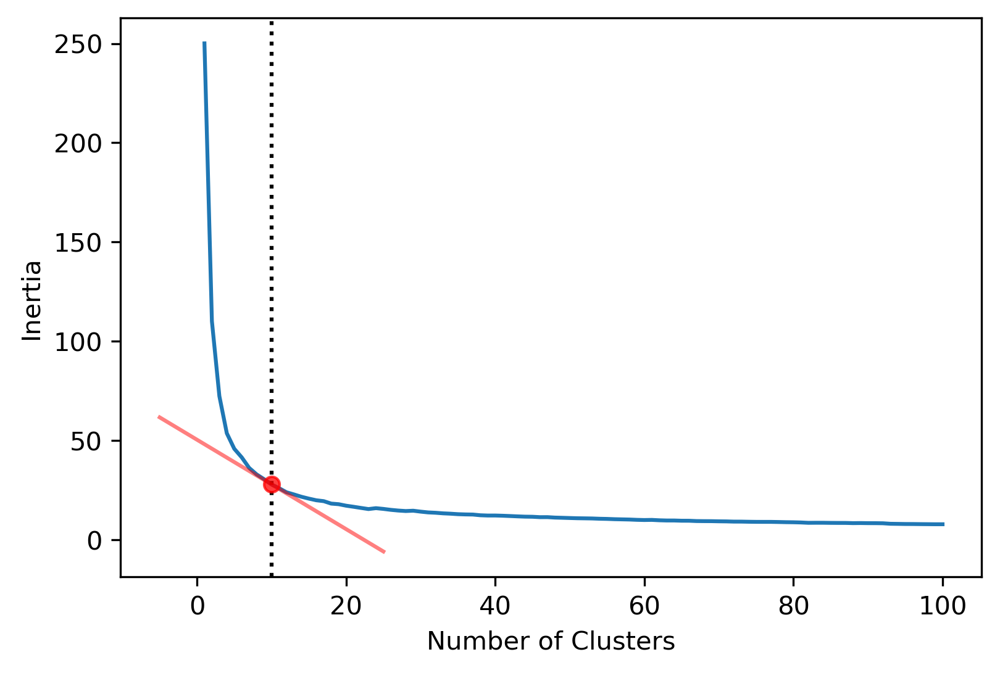

In [8]:
kl = KneeLocator(inves, kmeans_avg_values, curve="convex", direction="decreasing")

print(kl.knee)

plt.plot(inves, kmeans_avg_values)
plt.axvline(kl.knee, color='black', linestyle=':')
xt, yt = tangent_line(inves, kmeans_avg_values, kl.knee, width=30)
plt.plot(xt, yt, alpha=0.5, color='red', zorder=2)
plt.scatter(kl.knee, kmeans_avg_values[inves.index(kl.knee)], zorder=2, color='red', alpha=0.75)
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
#plt.title('Cluster Fitting Error')
plt.savefig('Plots/cluster_weighted_inertia_final.png', bbox_inches='tight', facecolor='white', dpi=300)
plt.show()

In [8]:
n = 10
kmeans = cluster_data(cs_photopeak_zero, n, quality=False)

  0%|          | 0/1000 [00:00<?, ?it/s]

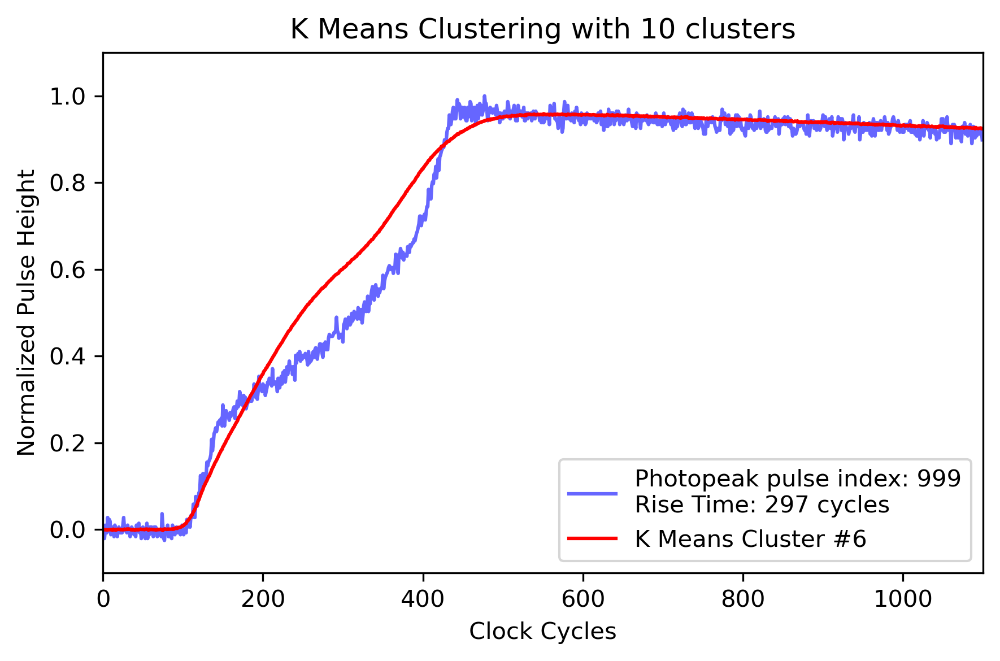

In [11]:
fig = plt.figure(dpi=300)
ax = fig.gca()

legend = ax.legend([''])

pulse = ax.plot([], [], color='blue', alpha=0.6)
mean = ax.plot([], [], color='red')

plots = [pulse, mean]

def init_plot():
    # Chemical Spectra subplot init
    ax.set_xlim(0, len(cs_photopeak_zero[0]))
    ax.set_ylim(-0.1, np.max(cs_photopeak_zero)+0.1)
    ax.set_xlabel('Clock Cycles')
    ax.set_ylabel('Normalized Pulse Height')
    ax.set_title('K Means Clustering with {} clusters'.format(n))
    #ax.xaxis.set_minor_locator(MultipleLocator(10))
    #ax.grid(which='major')
    #ax.grid(which='minor', linestyle='--', alpha=0.2)
    #ax.set_aspect('auto')
    fig.tight_layout()
    return plots

def animate(fr, legend, photopeak, kmeans, rise_times):
    #print(plots[0][0])
    plots[0][0].set_data(np.arange(len(photopeak[fr])), photopeak[fr])
    plots[0][0].set_label('Photopeak pulse index: {}\nRise Time: {} cycles'.format(fr, rise_times[fr]))
    
    plots[1][0].set_data(np.arange(len(kmeans.cluster_centers_[kmeans.labels_[fr]])), kmeans.cluster_centers_[kmeans.labels_[fr]])
    plots[1][0].set_label('K Means Cluster #{}'.format(kmeans.labels_[fr]))
    
    legend.remove()
    legend = ax.legend(loc='lower right', fontsize=10)
    
    return plots + [legend]
    
metadata = dict(title='K Means Animation', artist='Chris Lamb', comment='Just interact in the same place')

frames = 1000
fps = 5

ani = animation.FuncAnimation(fig, animate, init_func=init_plot, frames=tqdm(range(frames), leave=True),
                                  fargs=(legend, cs_photopeak_zero, kmeans, rise_times))
FFwriter = animation.FFMpegWriter(fps=fps, metadata=metadata)
ani.save('Plots/K_means_{}clusters_Cs137_PP.mp4'.format(n), writer=FFwriter)

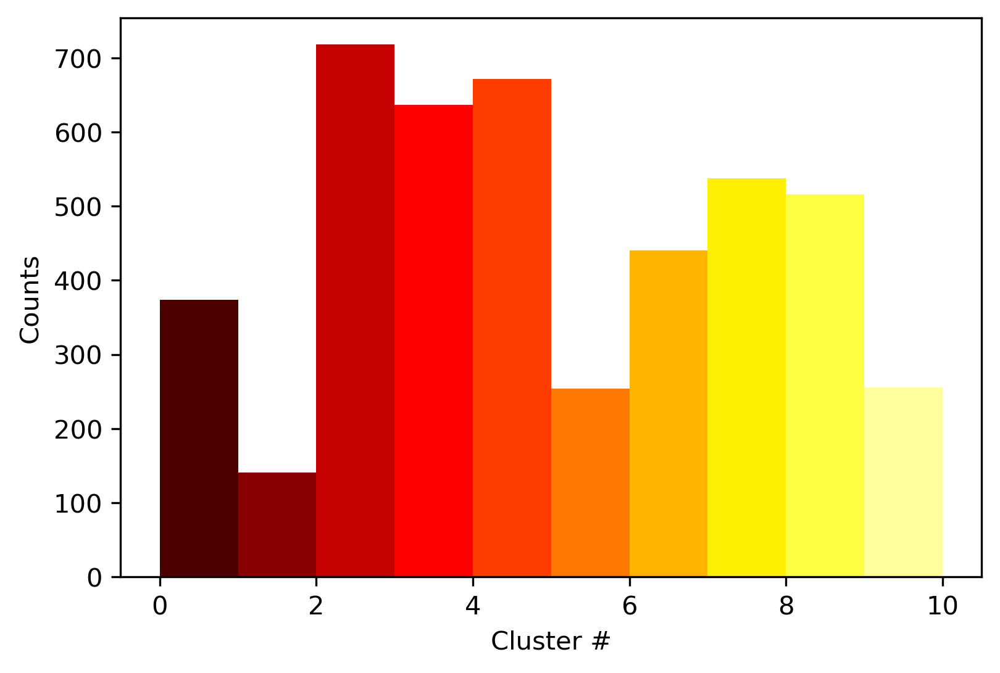

In [11]:
cmap = plt.get_cmap('hot')
colors = cmap(np.linspace(0.1, 0.9, n))

c,b,patches = plt.hist(kmeans.labels_, bins=np.arange(n+1))
#plt.axhline(1, color='r')
for p, patch in enumerate(patches):
    patch.set_facecolor(colors[p])
plt.ylabel('Counts')
plt.xlabel('Cluster #')
plt.savefig('Plots/clusters_distribution.png', dpi=300, facecolor='white', bbox_inches='tight')
plt.show()

In [31]:
np.sum(c)*

4546.0

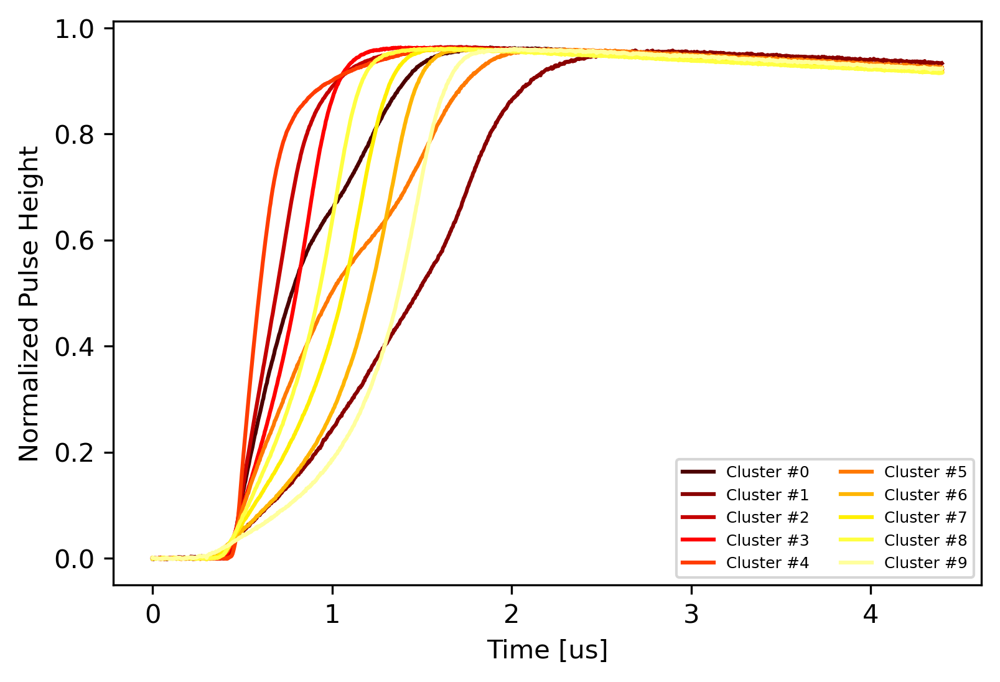

In [18]:
cmap = plt.get_cmap('hot')
colors = cmap(np.linspace(0.1, 0.9, n))

for k in range(n):
    plt.plot(4e-3*np.arange(len(kmeans.cluster_centers_[k])), kmeans.cluster_centers_[k],
             color=colors[k], alpha=1, label='Cluster #{}'.format(k))
plt.legend(ncol=2, fontsize=6)
plt.ylabel('Normalized Pulse Height')
plt.xlabel('Time [us]')
plt.savefig('Plots/clusters_centers.png', dpi=300, facecolor='white', bbox_inches='tight')
plt.show()

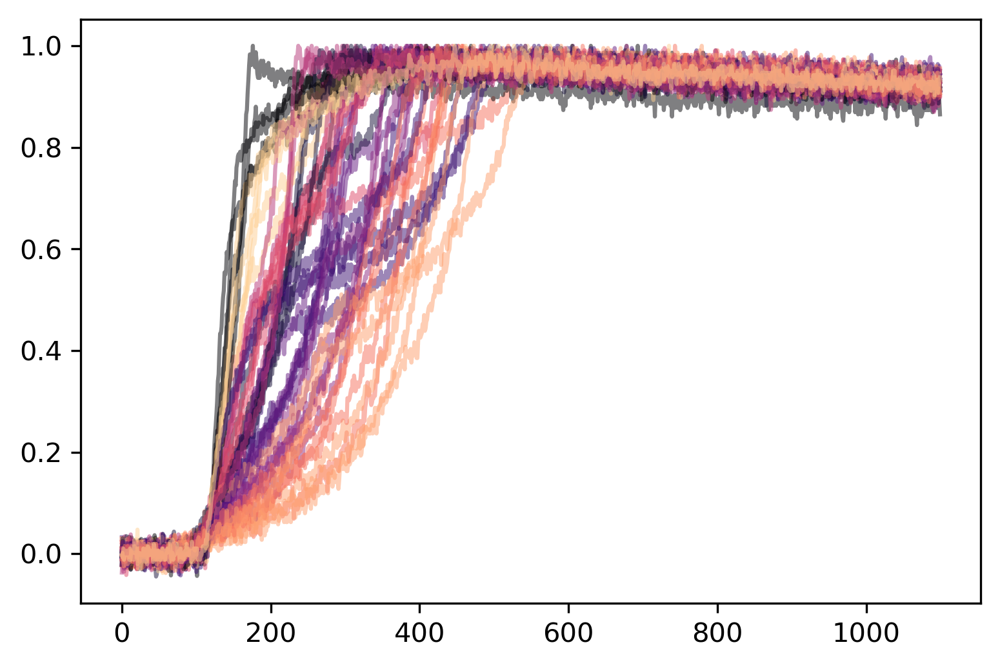

In [99]:
cmap = plt.get_cmap('magma')
colors = cmap(np.linspace(0, 0.9, n))

for i in range(5):
    for c in range(n):
        plt.plot(cs_photopeak_zero[np.argwhere(kmeans.labels_==c)[:,0]][i], color=colors[c], alpha=0.5)
plt.show()

In [13]:
len(cs_photopeak_inds[inds[np.argwhere(kmeans.labels_==2)[:,0]]])

447

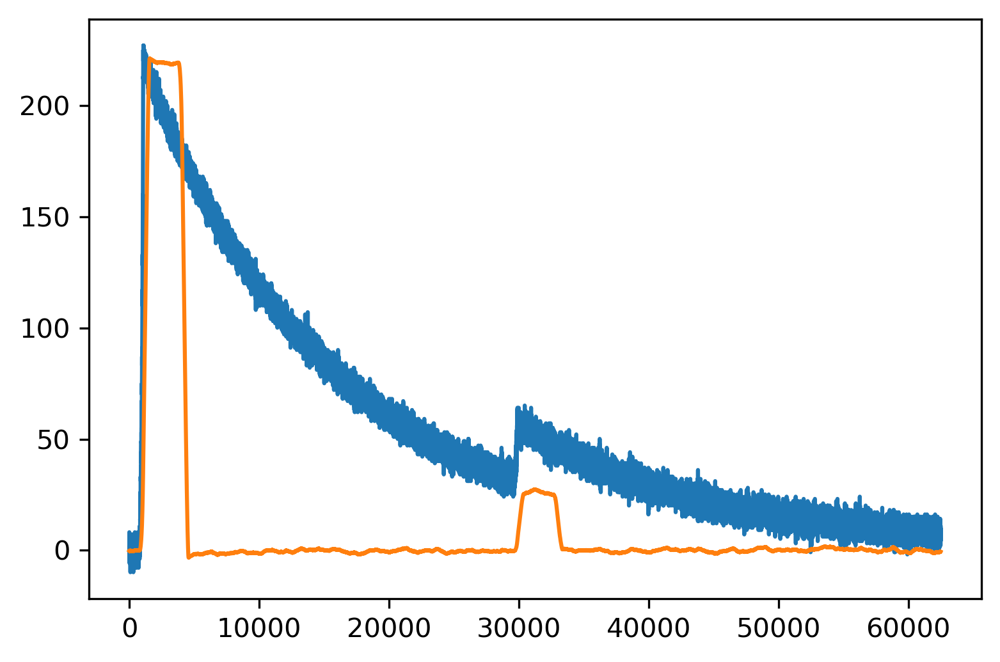

In [29]:
plt.plot(reset_zero(data[cs_photopeak_inds[inds[np.argwhere(kmeans.labels_==2)[:,0]]][168]]))
plt.plot(trapezoid_filter(data[cs_photopeak_inds[inds[np.argwhere(kmeans.labels_==2)[:,0]]][168]], 500, 2500, 15000))

In [39]:
pulse = data[cs_photopeak_inds[inds[np.argwhere(kmeans.labels_==2)[:,0]]][152]]

theo_area = np.max(reset_zero(pulse))*(500+2500)
trap = trapezoid_filter(pulse, 500, 2500, 15000)

In [40]:
theo_area

967763.9999999992

In [41]:
np.sum(trap)

1061645.803423614

In [42]:
possible_pileup(data[cs_photopeak_inds[inds[np.argwhere(kmeans.labels_==2)[:,0]]][151:153]], 500, 2500, 15000, 1.05)

Detecting Pileup:   0%|          | 0/2 [00:00<?, ?it/s]

[1]

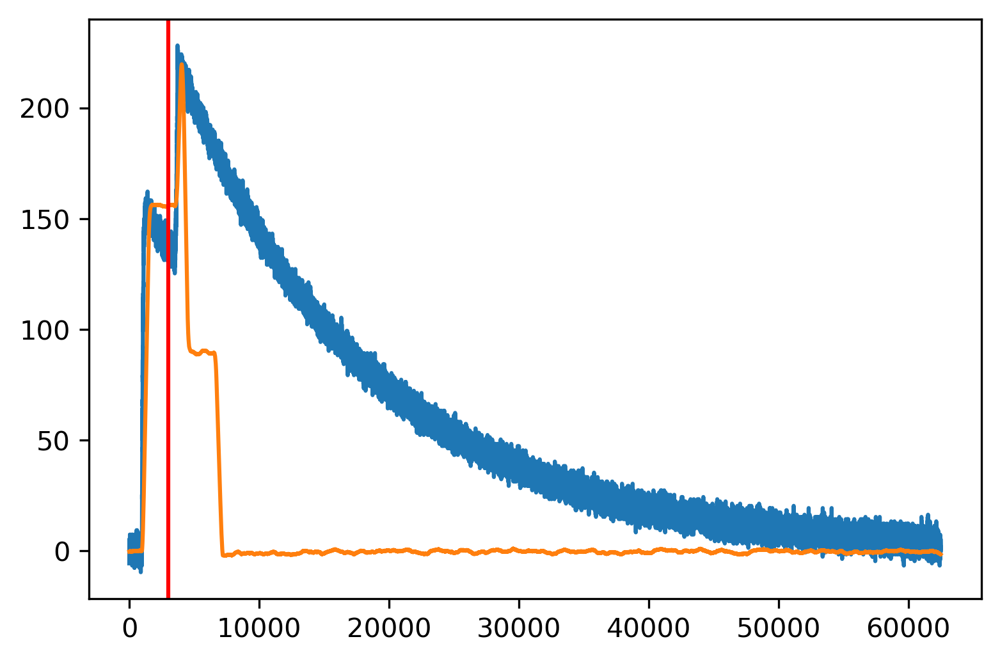

In [33]:
plt.plot(reset_zero(data[cs_photopeak_inds[inds[np.argwhere(kmeans.labels_==5)[:,0]]][400]]))
plt.plot(trapezoid_filter(data[cs_photopeak_inds[inds[np.argwhere(kmeans.labels_==5)[:,0]]][400]], 500, 2500, 15000))
plt.axvline(3000, c='r')

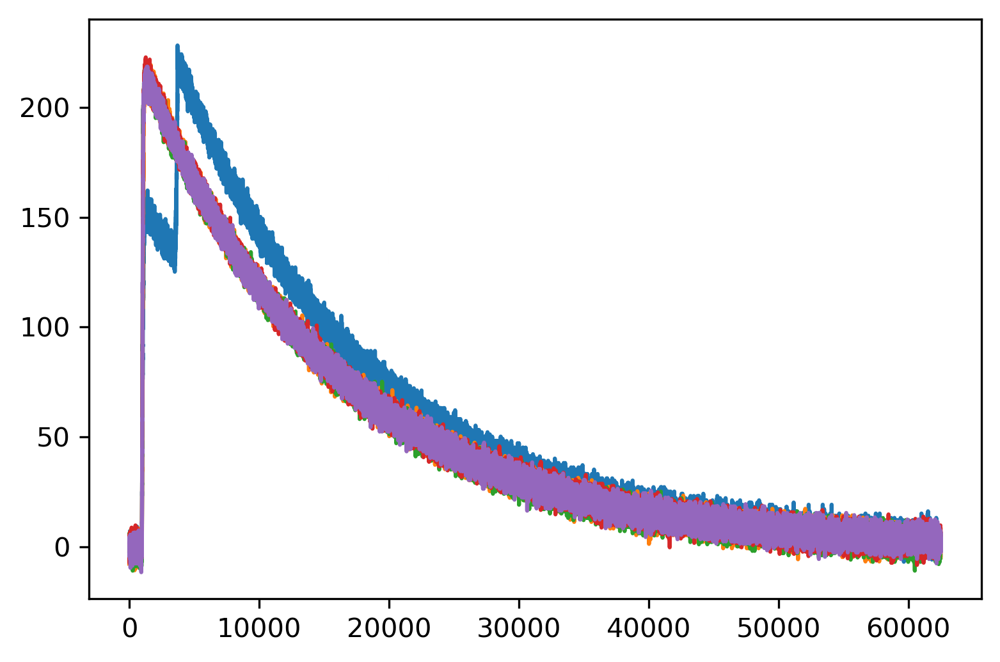

In [30]:
#for n in range(10):
plt.figure()
for i, ind in enumerate(cs_photopeak_inds[inds[np.argwhere(kmeans.labels_==5)[:,0]]]):
    plt.plot(reset_zero(data[ind], samp_size=50))
#plt.xlabel('Time [us]')
#plt.savefig('Plots/cluster{}_pulses.png'.format(0), dpi=300, facecolor='white', bbox_inches='tight')

In [51]:
ind

9287

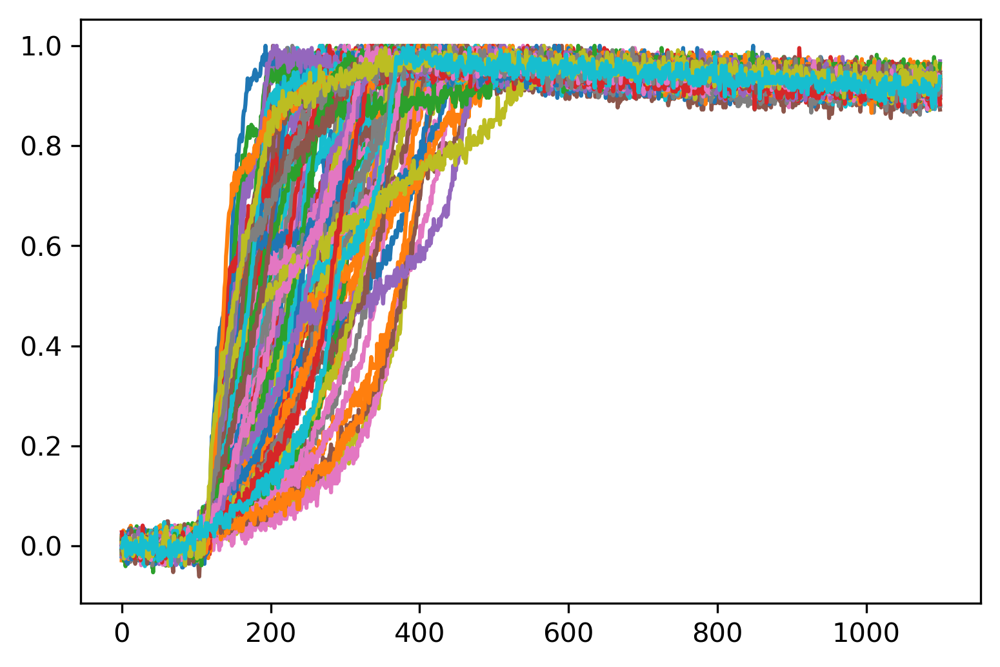

In [119]:
for i in range(200,300):
    plt.plot(cs_photopeak_zero[i][:3000])

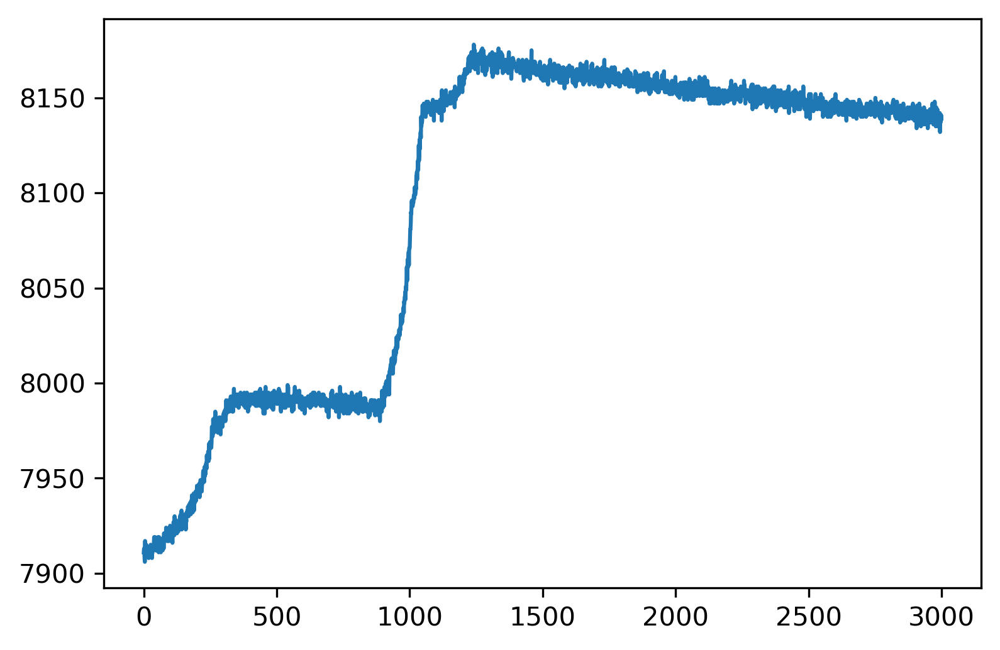

In [121]:
plt.plot(cs_photopeak[703][:3000])

In [137]:
data[cs_photopeak_inds[inds[np.argwhere(kmeans.labels_==0)[:,0]]]]

array([[7907, 7906, 7903, ..., 7912, 7912, 7918],
       [7910, 7906, 7914, ..., 7917, 7910, 7914],
       [7910, 7913, 7907, ..., 7912, 7914, 7913],
       ...,
       [7913, 7912, 7911, ..., 7912, 7910, 7912],
       [7901, 7902, 7909, ..., 7913, 7914, 7911],
       [7911, 7908, 7907, ..., 7911, 7912, 7916]], dtype=uint16)

In [140]:
energies_0 = calibrate_pulses(data[cs_photopeak_inds[inds[np.argwhere(kmeans.labels_==0)[:,0]]]])

Creating spectra:   0%|          | 0/303 [00:00<?, ?it/s]

In [11]:
energies_clusters = []
pulses_clusters = []
for b in range(10):
    pulses = data[cs_photopeak_inds[inds[np.argwhere(kmeans.labels_==b)[:,0]]]]
    pulses_clusters.append(pulses)
    energies_clusters.append(calibrate_pulses(pulses))

Creating spectra:   0%|          | 0/418 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/302 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/554 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/641 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/163 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/719 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/287 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/751 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/580 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/478 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/4894 [00:00<?, ?it/s]

Using new trapezoid filtering technique


Creating spectra:   0%|          | 0/418 [00:00<?, ?it/s]

Using new trapezoid filtering technique


Creating spectra:   0%|          | 0/302 [00:00<?, ?it/s]

Using new trapezoid filtering technique


Creating spectra:   0%|          | 0/554 [00:00<?, ?it/s]

Using new trapezoid filtering technique


Creating spectra:   0%|          | 0/641 [00:00<?, ?it/s]

Using new trapezoid filtering technique


Creating spectra:   0%|          | 0/163 [00:00<?, ?it/s]

Using new trapezoid filtering technique


Creating spectra:   0%|          | 0/719 [00:00<?, ?it/s]

Using new trapezoid filtering technique


Creating spectra:   0%|          | 0/287 [00:00<?, ?it/s]

Using new trapezoid filtering technique


Creating spectra:   0%|          | 0/751 [00:00<?, ?it/s]

Using new trapezoid filtering technique


Creating spectra:   0%|          | 0/580 [00:00<?, ?it/s]

Using new trapezoid filtering technique


Creating spectra:   0%|          | 0/478 [00:00<?, ?it/s]

Using new trapezoid filtering technique


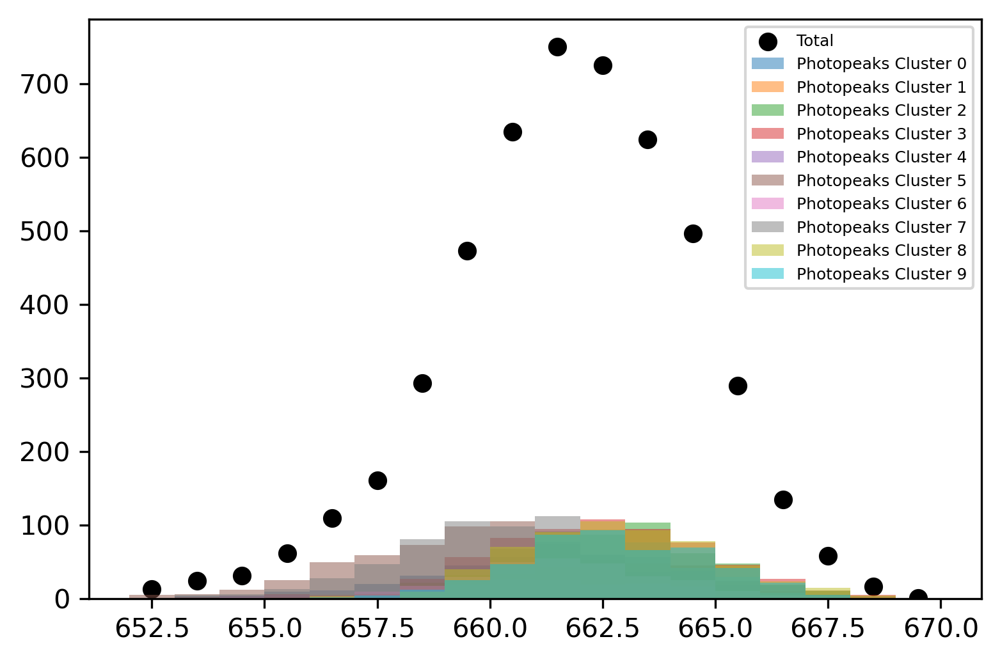

In [15]:
bins_ = np.linspace(652, 670, 19)
counts, bi, _ = plt.hist(calibrate_pulses(cs_photopeak), bins=bins_)
plt.close()
plt.scatter(bins_[:-1]+0.5, counts, color='black', label='Total')
for b in range(10):
    plt.hist(calibrate_pulses(data[cs_photopeak_inds[inds[np.argwhere(kmeans.labels_==b)[:,0]]]]), 
             bins=bins_, label='Photopeaks Cluster {}'.format(b), alpha=0.5)
plt.legend(fontsize=6)
plt.show()

In [50]:
calibrate_pulses

<function NE204_Functions.calibrate_pulses(data, peak=500, gap=2500, tau=15000, max_energy=3000, return_inds=False, calibrated=True, max_trapezoid_height=1000, save_file=None, svw=51, use_CFD=False, shift=500, samp_size=500, new_trapezoid=True, use_calib=None)>

In [ ]:
rise_times = []
for pp in tqdm(range(len(cs_photopeak_zero))):
    signal = savgol_filter(cs_photopeak_zero[pp], 31, 0)
    rise_times.append(CFD(signal, 0.9, samp_size=50)-CFD(signal, 0.1, samp_size=50))

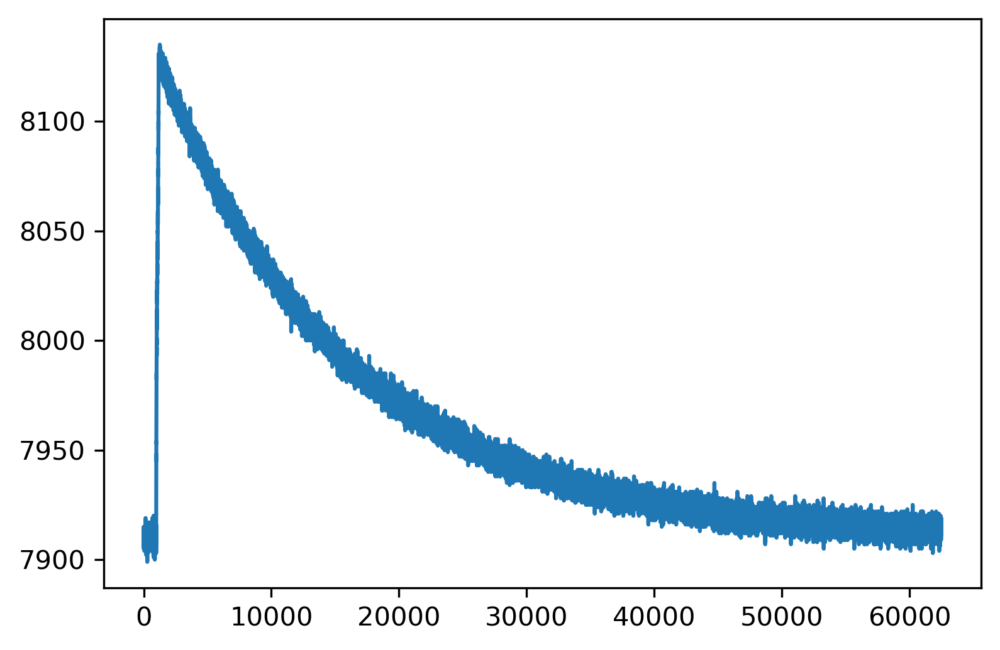

In [60]:
plt.plot(pulses_clusters[0][0])

In [14]:
def optimize_trapezoid_parameters(data, emin, emax, svw=31):
    # Optimizes peaking and gap time for a set of pulses given an energy range of interest
    # Used given purely photopeak events within a spectra
    rise_times = []
    for pp in tqdm(range(len(data)), desc='Determining rise times in data', leave=False):
        signal = savgol_filter(data[pp], svw, 0)
        rise_times.append(CFD(signal, 0.9, samp_size=50)-CFD(signal, 0.1, samp_size=50))
    rise_times = np.array(rise_times)
    
    peak_range = range(200, 610, 10)
    gap_range = range(500, 2525, 25)
    
    bins_ = np.linspace(emin, emax, (emax-emin)+1)
    means, stds = [], []
    parameters = []
    for p in tqdm(peak_range, leave=False):
        means_p, stds_p = [], []
        for g in tqdm(gap_range, leave=False):
            energies_temp = calibrate_pulses(data, p, g, 15000)
            counts, b, _ = plt.hist(energies_temp, bins=bins_)
            plt.close()
            gf = gauss_fit(bins_[:-1], counts)
            
            means_p.append(gf[2])
            stds_p.append(gf[3])
            parameters.append([p, g])
        means.append(means_p)
        stds.append(stds_p)
    means = np.array(means)
    stds = np.array(stds)
    return means, stds, parameters

In [15]:
n = 10
kmeans = cluster_data(cs_photopeak_zero, n, quality=False)

In [16]:
energies_clusters = []
pulses_clusters = []
for b in range(10):
    pulses = data[cs_photopeak_inds[inds[np.argwhere(kmeans.labels_==b)[:,0]]]]
    pulses_clusters.append(pulses)
    energies_clusters.append(calibrate_pulses(pulses))

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

In [17]:
for cluster in tqdm(range(n)):
    means, stds, parameters = optimize_trapezoid_parameters(pulses_clusters[cluster], 652, 670)
    #optimimums.append(parameters[np.argmin(stds)])

    np.save('Data/Clusters-Optimization/means_cluster_{}.npy'.format(cluster), means)
    np.save('Data/Clusters-Optimization/stds_cluster_{}.npy'.format(cluster), stds)

    plt.imshow(np.flipud(stds), extent=(500, 2500, 200, 600), aspect='auto', cmap='plasma')
    plt.xlabel('Gap Time')
    plt.ylabel('Peaking Time')
    plt.title('Cluster {} Optimization'.format(cluster))
    plt.colorbar(label='Standard Deviation [keV]')
    #plt.scatter(parameters[np.argmin(stds)][1], parameters[np.argmin(stds)][0], s=10, edgecolors='black', color='red')
    plt.savefig('Plots/Clusters-Optimization/STD-Cluster-{}.png'.format(cluster), dpi=300, facecolor='white', bbox_inches='tight')
    plt.close()

    plt.imshow(np.flipud(stds), extent=(500, 2500, 200, 600), aspect='auto', cmap='plasma')
    plt.xlabel('Gap Time')
    plt.ylabel('Peaking Time')
    plt.title('Cluster {} Optimization\nOptimum at P{} G{}'.format(cluster, parameters[np.argmin(stds)][0], parameters[np.argmin(stds)][1]))
    plt.colorbar(label='Standard Deviation [keV]')
    plt.scatter(parameters[np.argmin(stds)][1], parameters[np.argmin(stds)][0], s=10, edgecolors='black', color='red')
    plt.savefig('Plots/Clusters-Optimization/Optimum-STD-Cluster-{}.png'.format(cluster), dpi=300, facecolor='white', bbox_inches='tight')
    plt.close()

    plt.imshow(np.flipud(means), extent=(500, 2500, 200, 600), aspect='auto', cmap='magma')
    plt.xlabel('Gap Time')
    plt.ylabel('Peaking Time')
    plt.title('Cluster {} Energies'.format(cluster))
    plt.colorbar(label='Peak Energy [keV]')
    #plt.scatter(parameters[np.argmin(stds)][1], parameters[np.argmin(stds)][0], s=10, edgecolors='black', color='red')
    plt.savefig('Plots/Clusters-Optimization/Mean-Cluster-{}.png'.format(cluster), dpi=300, facecolor='white', bbox_inches='tight')
    plt.close()

  0%|          | 0/10 [00:00<?, ?it/s]

Determining rise times in data:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/374 [00:00<?, ?it/s]

Determining rise times in data:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/141 [00:00<?, ?it/s]

Determining rise times in data:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/718 [00:00<?, ?it/s]

Determining rise times in data:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

Determining rise times in data:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/672 [00:00<?, ?it/s]

Determining rise times in data:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/254 [00:00<?, ?it/s]

Determining rise times in data:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/440 [00:00<?, ?it/s]

Determining rise times in data:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/538 [00:00<?, ?it/s]

Determining rise times in data:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/516 [00:00<?, ?it/s]

Determining rise times in data:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/81 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/256 [00:00<?, ?it/s]

In [18]:
stds[:,4:].shape

(41, 91)

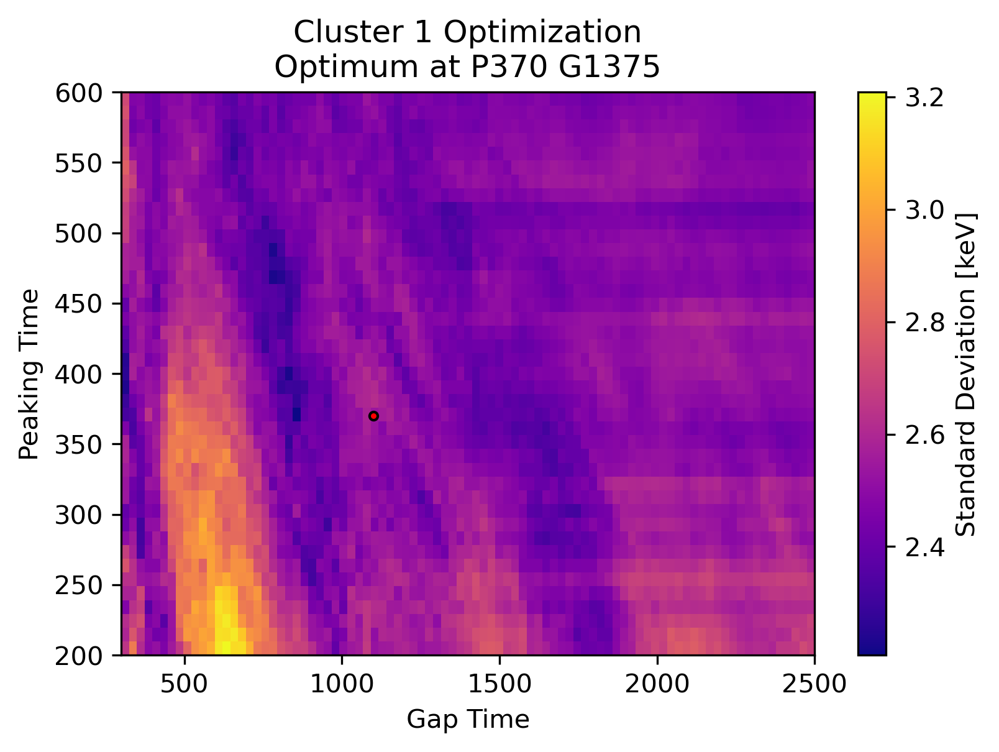

In [27]:
plt.imshow(np.flipud(stds[:,4:]), extent=(300, 2500, 200, 600), aspect='auto', cmap='plasma')
plt.xlabel('Gap Time')
plt.ylabel('Peaking Time')
plt.title('Cluster {} Optimization\nOptimum at P{} G{}'.format(cluster, parameters[len(parameters)-(41*91):][np.argmin(stds[:,4:])][0], parameters[np.argmin(stds[:,4:])][1]))
plt.colorbar(label='Standard Deviation [keV]')
plt.scatter(parameters[len(parameters)-(41*91):][np.argmin(stds[:,4:])][1], parameters[len(parameters)-(41*91):][np.argmin(stds[:,4:])][0], s=10, edgecolors='black', color='red')

In [ ]:
print("test")

In [35]:
stds = np.array(stds)

In [39]:
np.argwhere(stds==np.min(stds))

array([[20, 43]])

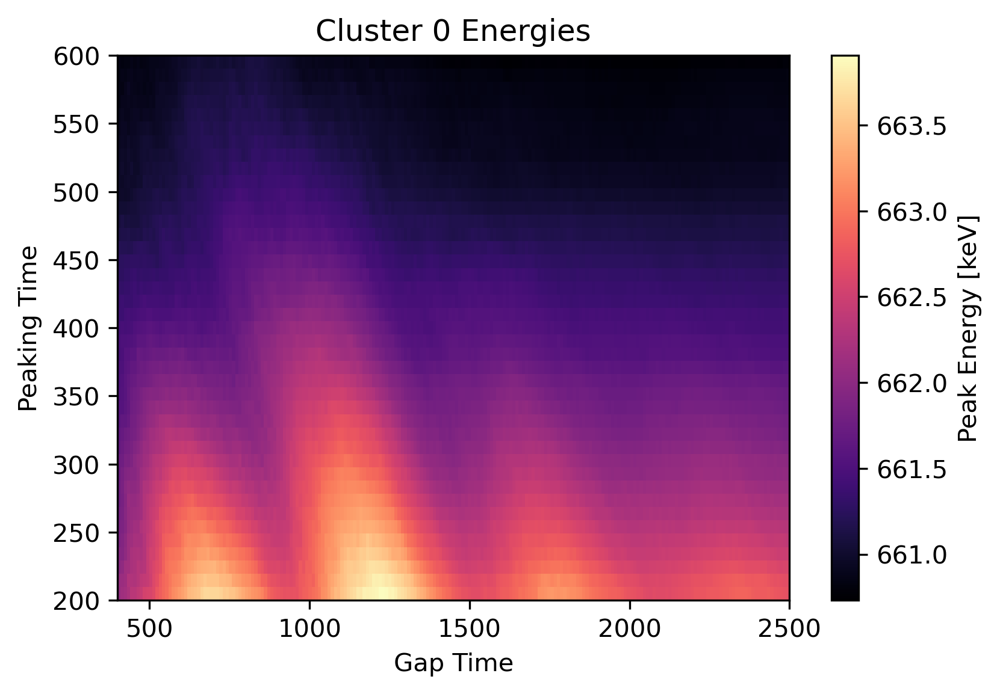

In [62]:
plt.imshow(np.flipud(stds), extent=(400, 2500, 200, 600), aspect='auto', cmap='plasma')
plt.xlabel('Gap Time')
plt.ylabel('Peaking Time')
plt.title('Cluster 0 Optimization')
plt.colorbar(label='Standard Deviation')
plt.scatter(parameters[np.argmin(stds)][1], parameters[np.argmin(stds)][0], s=10, edgecolors='black', color='red')
plt.savefig('Plots/Cluster-{}-Trapezoid-Optimization.png'.format(cluster), dpi=300, facecolor='white', bbox_inches='tight')

In [ ]:
cmap = plt.get_cmap('magma')
colors = cmap(np.linspace(0, 0.9, n))

plt.imshow(np.flipud(means), extent=(400, 2500, 200, 600), aspect='auto', cmap='magma')
plt.xlabel('Gap Time')
plt.ylabel('Peaking Time')
plt.title('Cluster 0 Optimization')
plt.colorbar(label='Peak Energy [keV]')
#plt.scatter(parameters[np.argmin(stds)][1], parameters[np.argmin(stds)][0], s=10, edgecolors='black', color='red')
plt.savefig('Plots/Cluster-{}-Trapezoid-Optimization-mean.png'.format(0), dpi=300, facecolor='white', bbox_inches='tight')

In [202]:
plt.plot()

[2.4459063493571915,
 2.9093475611531683,
 2.838234535994147,
 2.7137893875602965,
 2.4372515471093537,
 2.3902551106432095,
 2.409877845454005,
 2.5167693270920575,
 2.4737799540664813,
 2.4535110996891913,
 2.568771400779653,
 2.4997055400200425,
 2.3675609238800917,
 2.3455541899617045,
 2.414040801313994,
 2.5710096792004977,
 2.551621950864676,
 2.5358756720855937,
 2.515440973172064,
 2.529740548194832,
 2.5690457467991847,
 2.545324505413751,
 2.5678190738284754,
 2.865850495335164,
 2.8506533641646947,
 2.6788552004237345,
 2.470175800697268,
 2.4430570476168447,
 2.5153497696848905,
 2.5259026422809097,
 2.501208076241272,
 2.5140918564237493,
 2.4119938164307086,
 2.419478113689668,
 2.3637231277787176,
 2.371587849843158,
 2.466130217665182,
 2.474158881909174,
 2.4982263223524854,
 2.474959916026134,
 2.4575230597658533,
 2.4655654586620344,
 2.4226185993318565,
 2.453704668668388,
 2.4980454405230574,
 2.643648575959363,
 2.779783452186421,
 2.5272074949295398,
 2.30287134

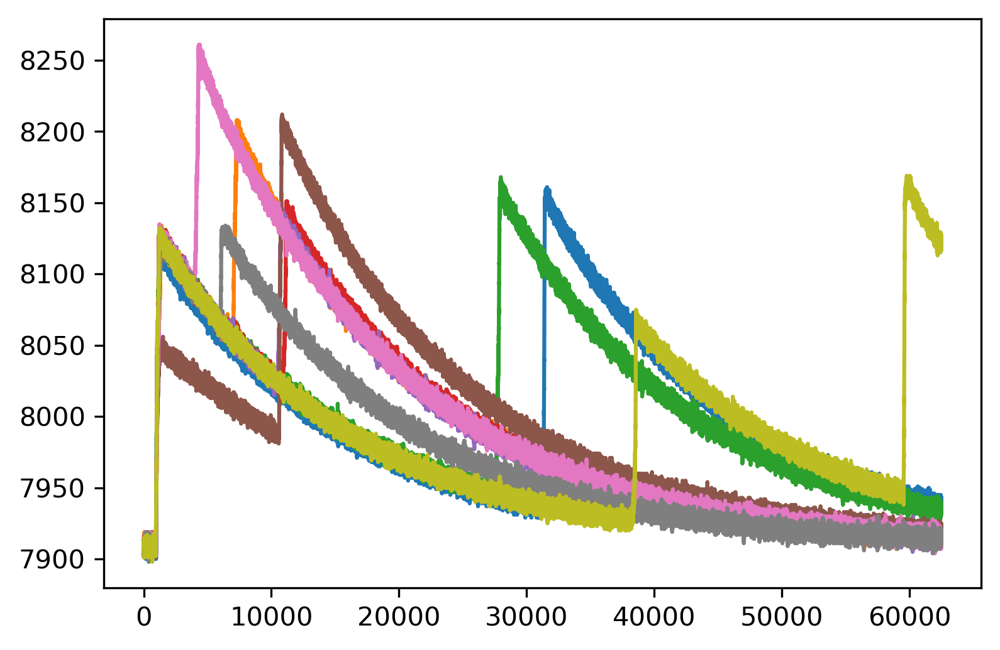

In [188]:
for pulse in pulses_clusters[0][np.argwhere(np.array(rt)>1000)[:,0]]:
    plt.plot(pulse)

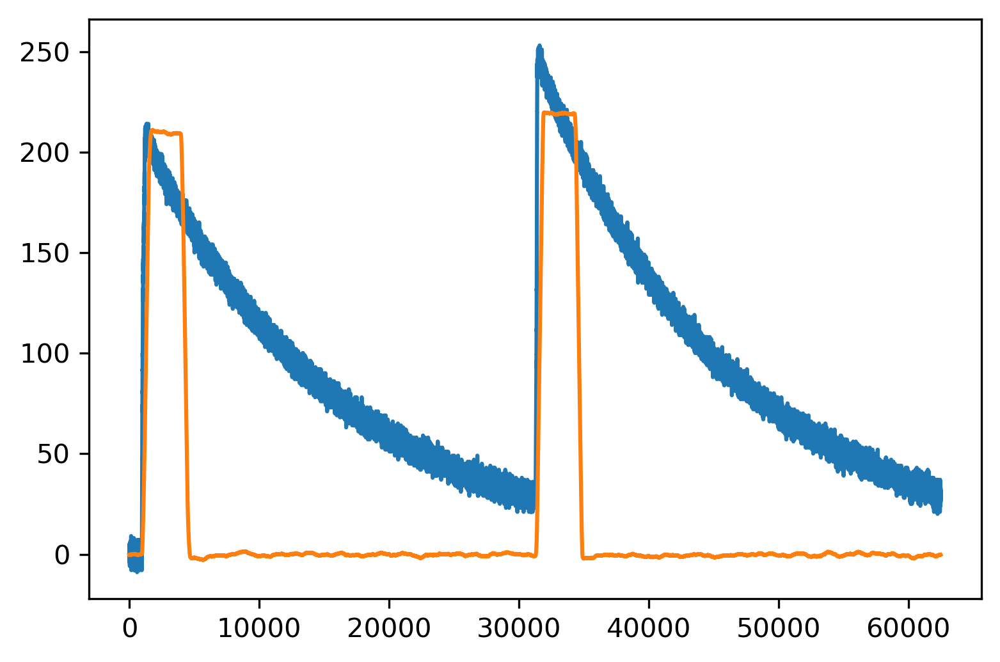

In [72]:
plt.plot(reset_zero(pulses_clusters[0][2]))
plt.plot(trapezoid_filter(pulses_clusters[0][2], 500, 2500, 15000))
plt.show()

In [81]:
np.gradient(trapezoid_filter(pulses_clusters[0][2], 500, 2500, 15000))

array([ 0.00271703, -0.00354927, -0.00356181, ..., -0.0094588 ,
        0.0055416 ,  0.011542  ])

In [83]:
np.where(np.gradient(trapezoid_filter(pulses_clusters[0][2], 500, 2500, 15000)) > 0, 1, -1)

array([ 1, -1, -1, ..., -1,  1,  1])

In [89]:
me = np.mean(np.gradient(trapezoid_filter(pulses_clusters[0][2], 500, 2500, 15000))[-501:-1])
st = np.std(np.gradient(trapezoid_filter(pulses_clusters[0][2], 500, 2500, 15000))[-501:-1])

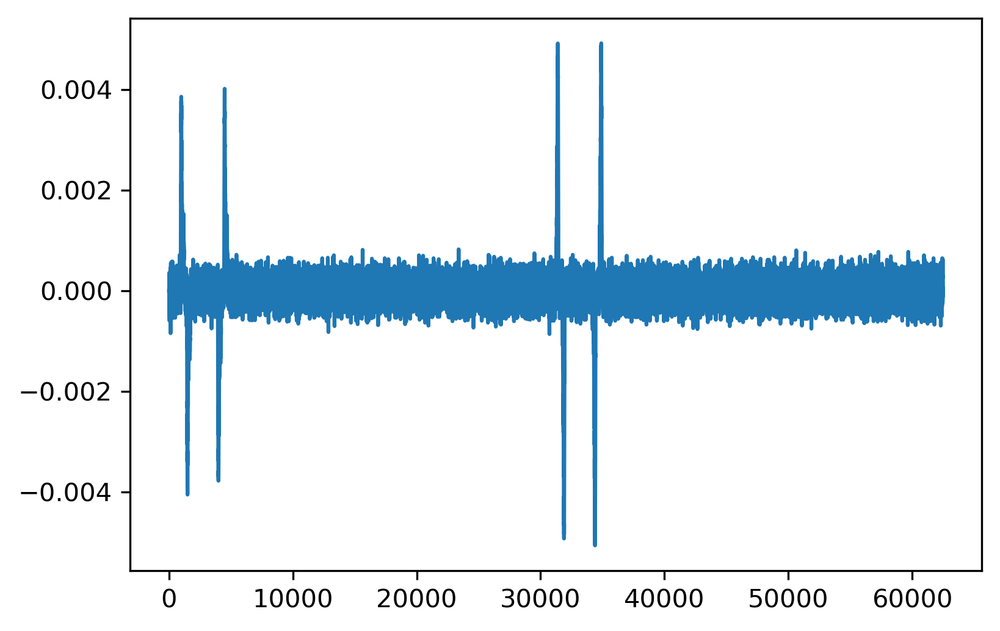

In [95]:
plt.plot(np.gradient(savgol_filter(np.gradient(trapezoid_filter(pulses_clusters[0][2], 500, 2500, 15000)), 51, 0)))


In [99]:
stt = time.time()
test = np.where(np.gradient(trapezoid_filter(pulses_clusters[0][2], 500, 2500, 15000))>8*st,1, 0)
print(time.time()-stt)

0.005393028259277344


In [101]:
from scipy.signal import find_peaks

In [104]:
find_peaks

<function scipy.signal._peak_finding.find_peaks(x, height=None, threshold=None, distance=None, prominence=None, width=None, wlen=None, rel_height=0.5, plateau_size=None)>

In [115]:
g = np.gradient(trapezoid_filter(pulses_clusters[0][2], 500, 2500, 15000))
mg = np.mean(g)
stg = np.std(g)

In [113]:
mg+3*stg

0.21860696191810894

In [114]:
find_peaks(np.gradient(trapezoid_filter(pulses_clusters[0][2], 500, 2500, 15000)), prominence=mg+3*stg)

(array([ 1340, 31716]),
 {'prominences': array([0.48083689, 0.91036347]),
  'left_bases': array([ 160, 4318]),
  'right_bases': array([ 4318, 34598])})

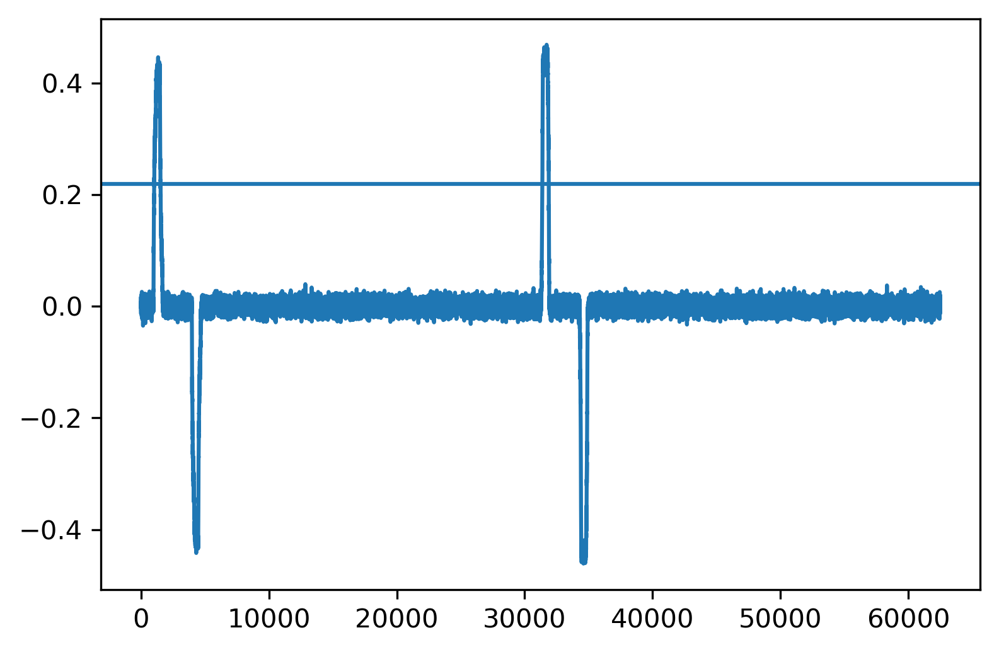

In [117]:
plt.plot(np.gradient(trapezoid_filter(pulses_clusters[0][2], 500, 2500, 15000)))
plt.axhline(mg+3*stg)

In [122]:
np.sum(trapezoid_filter(pulses_clusters[0][2], 500, 2500, 15000))

1263386.4036814433

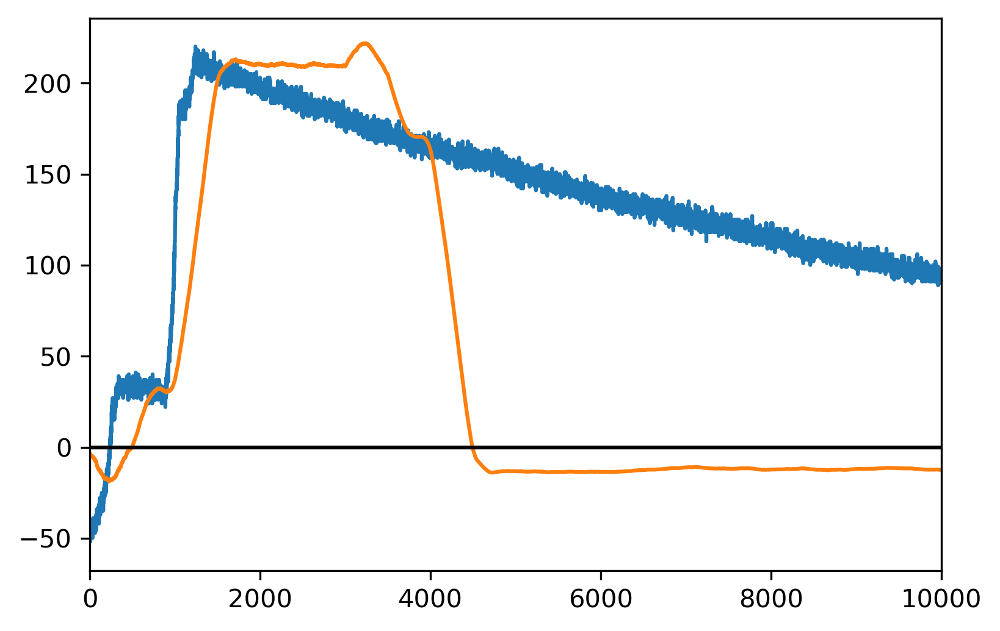

In [146]:
plt.plot(reset_zero(data[cs_photopeak_inds[704]]))
plt.plot(trapezoid_filter(data[cs_photopeak_inds[704]], 500, 2500, 15000))
plt.xlim(0,10000)
plt.axhline(0, color='k')

In [135]:
np.sum(trapezoid_filter(pulses_clusters[0][0], 500, 2500, 15000)[800:5000])

655883.5122796288

In [136]:
np.sum(trapezoid_filter(pulses_clusters[0][0], 500, 2500, 15000))

635610.0058065164

(800.0, 5000.0)

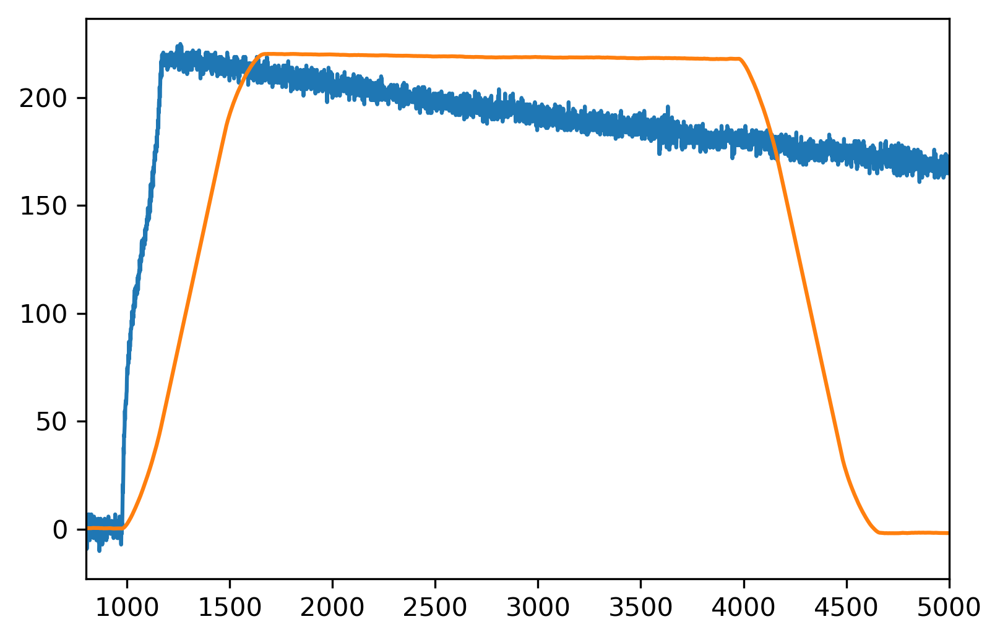

In [134]:
plt.plot(reset_zero(pulses_clusters[0][0]))
plt.plot(trapezoid_filter(pulses_clusters[0][0], 500, 2500, 15000))
plt.xlim(800,5000)

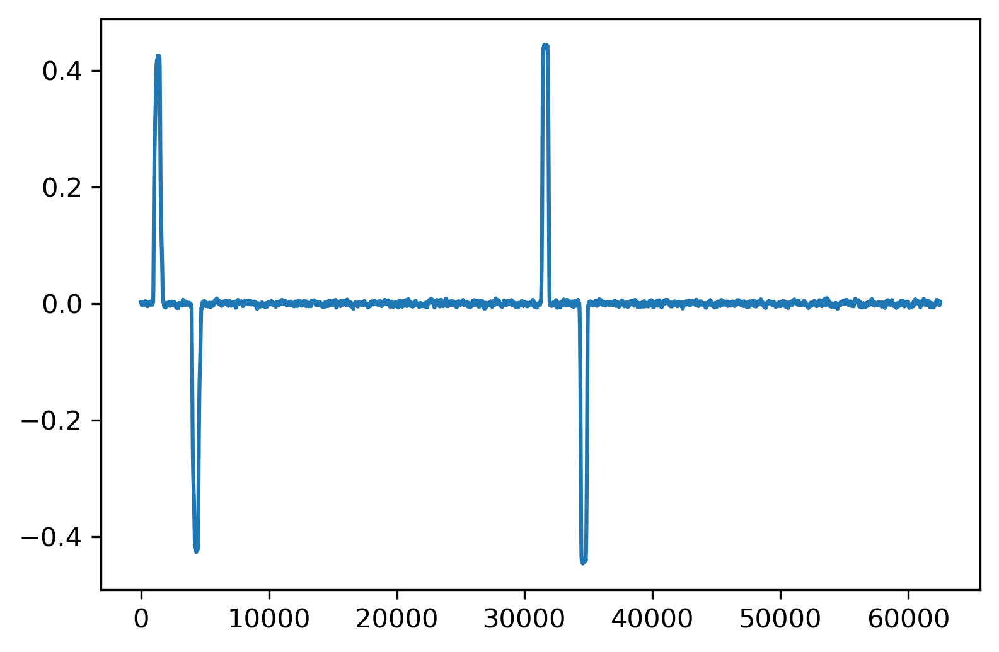

In [100]:
plt.plot(savgol_filter(np.gradient(trapezoid_filter(pulses_clusters[0][2], 500, 2500, 15000)), 51, 0))

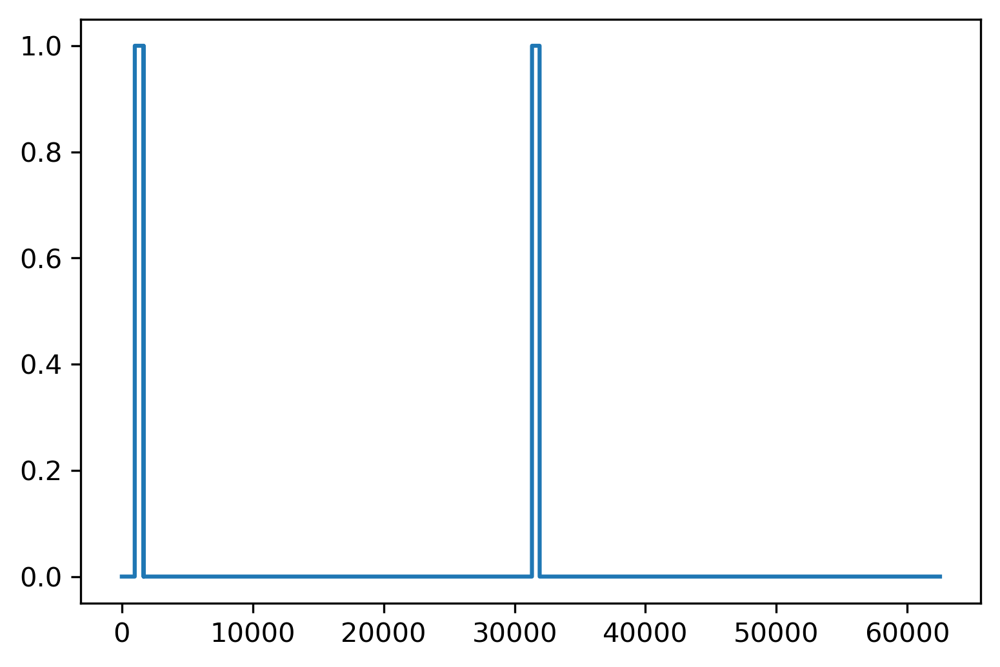

In [96]:
plt.plot(np.where(np.gradient(trapezoid_filter(pulses_clusters[0][2], 500, 2500, 15000))>8*st,1, 0))

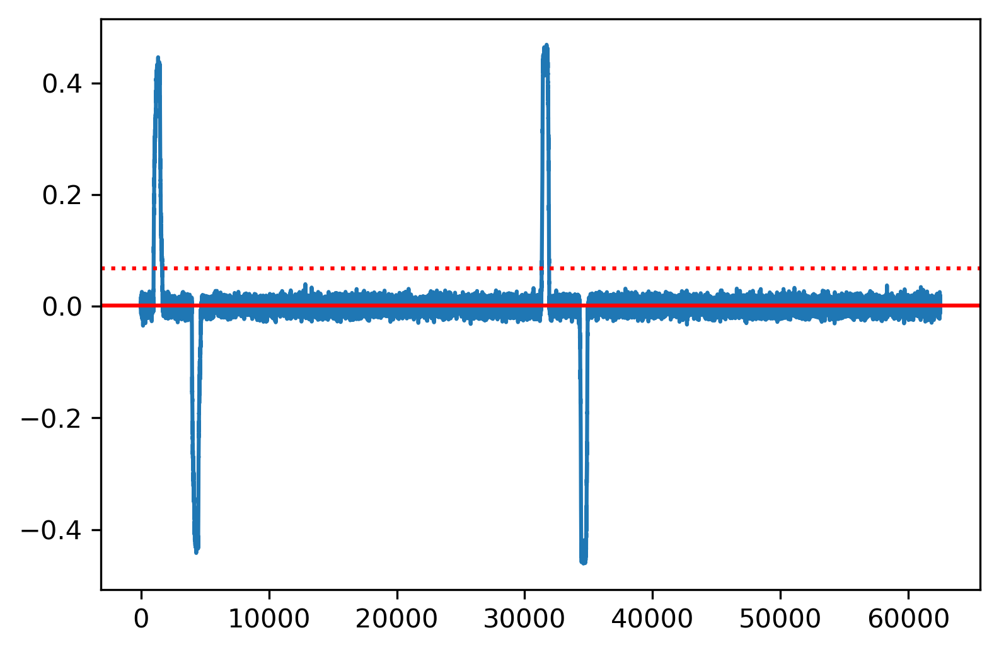

In [92]:
plt.plot(np.gradient(trapezoid_filter(pulses_clusters[0][2], 500, 2500, 15000)))
plt.axhline(me, color='r')
plt.axhline(me+8*st, color='r', linestyle=':')

Peak energy: 661.3804667582286 +- 0.17003680344012573
Peak sigma: 2.377972958661099 +- 0.2470583365518446
Calculated resolution: 0.847%


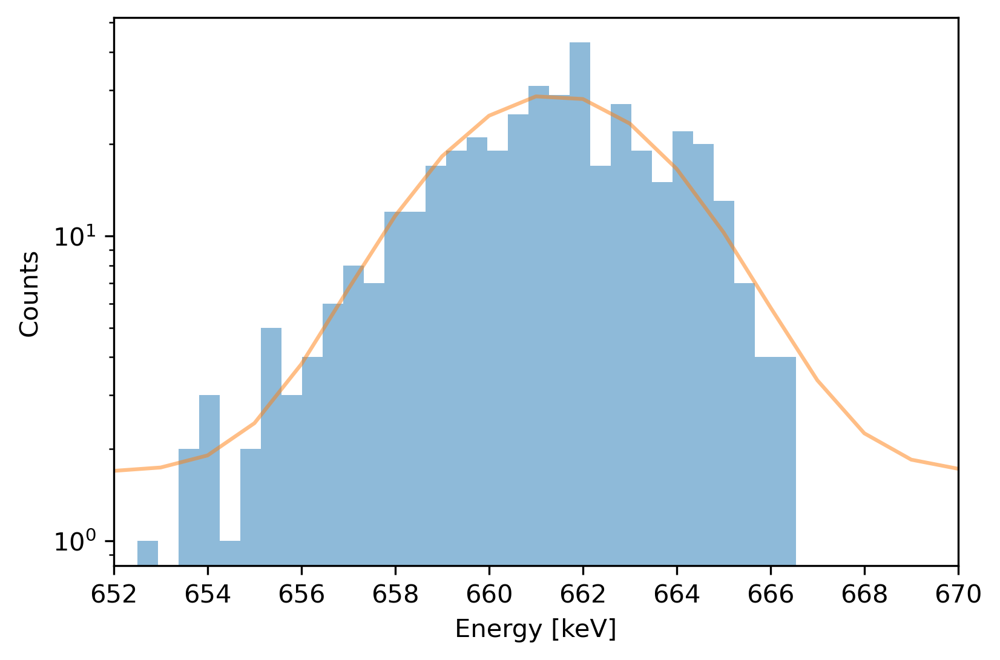

(array([  1.68431834,  27.30537383, 661.38046676,   2.37797296]),
 array([1.63132256, 2.11836143, 0.1700368 , 0.24705834]))

In [56]:
quick_resolution(energies_clusters[0], 652, 670, adc_bit=5)

Creating spectra:   0%|          | 0/418 [00:00<?, ?it/s]

Peak energy: 662.0492365104325 +- 0.13425096268207937
Peak sigma: 2.246319417135611 +- 0.17333439995339625
Calculated resolution: 0.799%


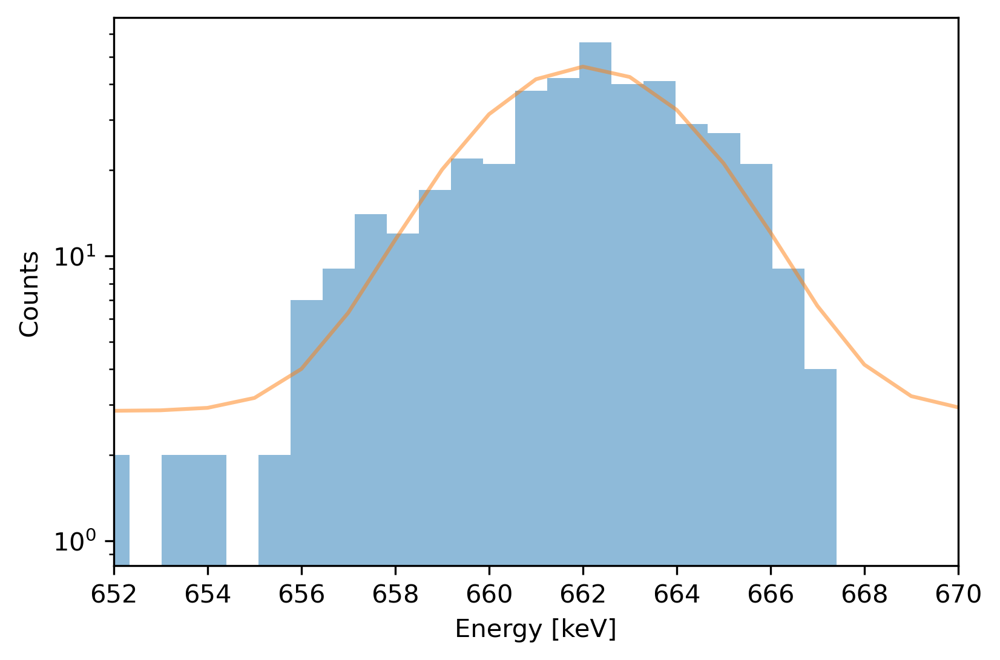

(array([  2.85733434,  43.25488061, 662.04923651,   2.24631942]),
 array([1.62921322, 2.56920069, 0.13425096, 0.1733344 ]))

In [55]:
quick_resolution(calibrate_pulses(pulses_clusters[0], 400, 830), 652, 670, adc_bit=5)

Creating spectra:   0%|          | 0/637 [00:00<?, ?it/s]

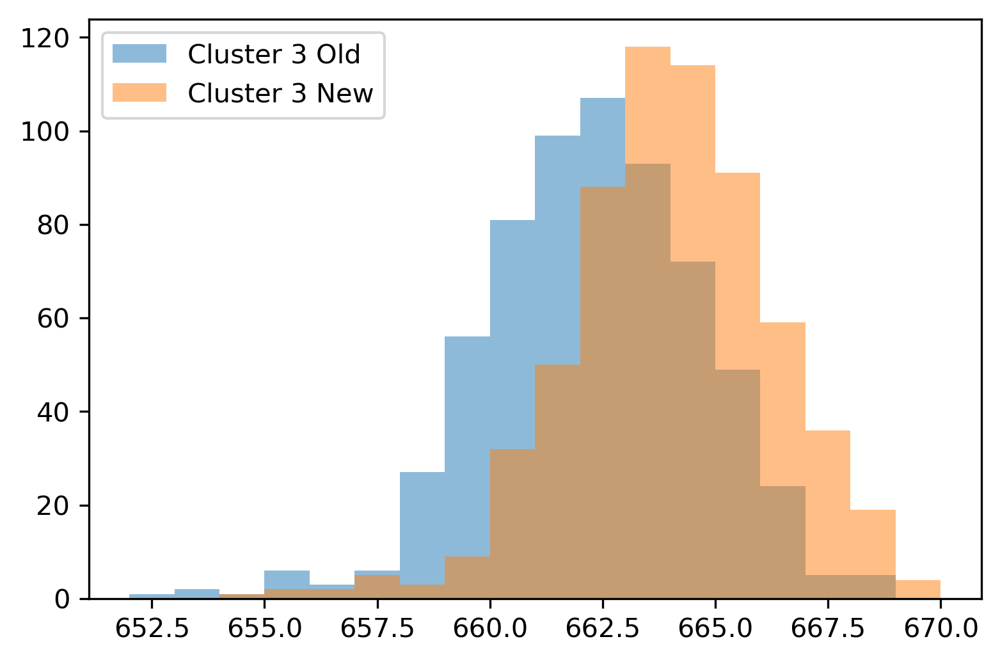

In [35]:
cluster = 3
plt.hist(energies_clusters[cluster], bins=np.linspace(652, 670, 19), 
         alpha=0.5, label='Cluster {} Old'.format(cluster))
plt.hist(calibrate_pulses(pulses_clusters[cluster], 240, 1775), 
         bins=np.linspace(652, 670, 19), alpha=0.5, label='Cluster {} New'.format(cluster))
plt.legend()
plt.show()

(0.0, 5000.0)

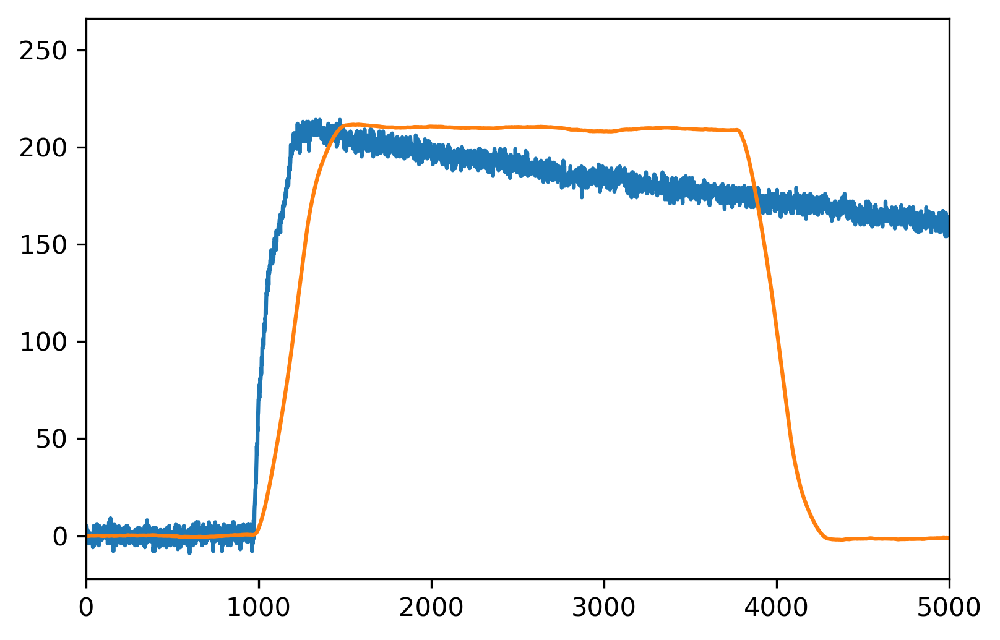

In [49]:
i = 2
plt.plot(reset_zero(cluster0[i]))
plt.plot(trapezoid_filter(cluster0[i], 300, 2500, 15000))
plt.xlim(0,5000)

In [163]:
counts.shape

(1100, 18)

In [13]:
tau_rise, tau_fall = 50, 500
t = np.linspace(0,5000,1000)

vt = (1/(tau_fall-tau_rise))*(np.exp(-t/tau_fall)-np.exp(-t/tau_rise))

In [19]:
data, saturated = import_data('../Lab-1/Data/Combined_Data/Cs137-24in-2.h5')

Checking for Saturation:   0%|          | 0/16145 [00:00<?, ?it/s]

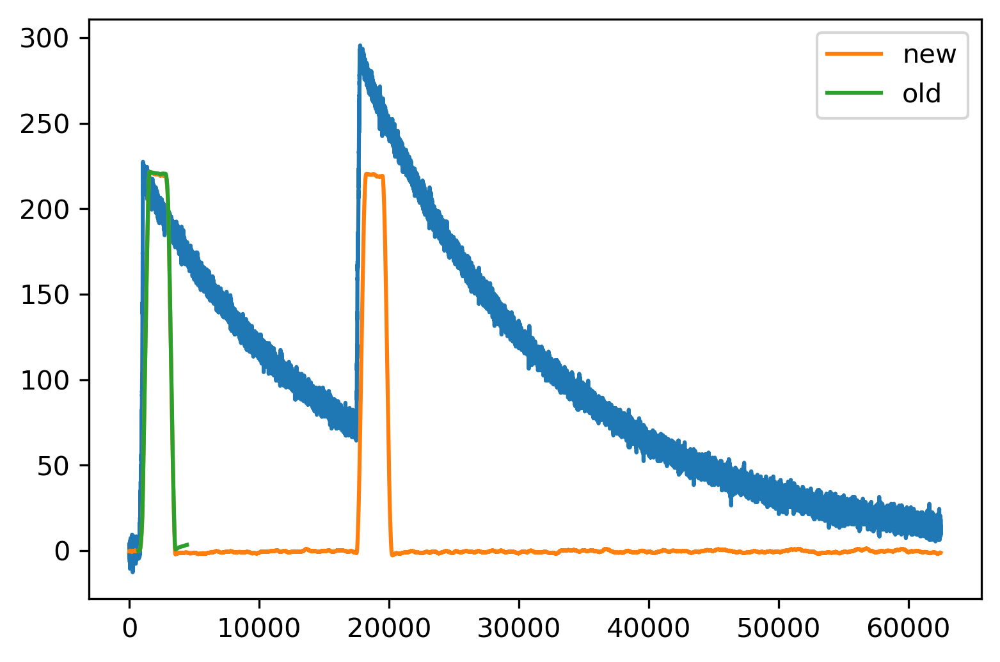

In [20]:
i = 1
plt.plot(reset_zero(data[i]))
#plt.plot(MWD(data[i], 2000, 14000))
plt.plot(trapezoid_filter(data[i], 500, 1500, 15000), label='new')
od = savgol_filter(data[i], 51, 0)
ot = (1/500)*s(od, determine_rise(od), 15000, 500, 1500)
plt.plot(np.arange(len(ot))+determine_rise(od), ot, label='old')
#plt.axhline(0, color='black')
plt.legend()
#plt.xlim(0,5000)

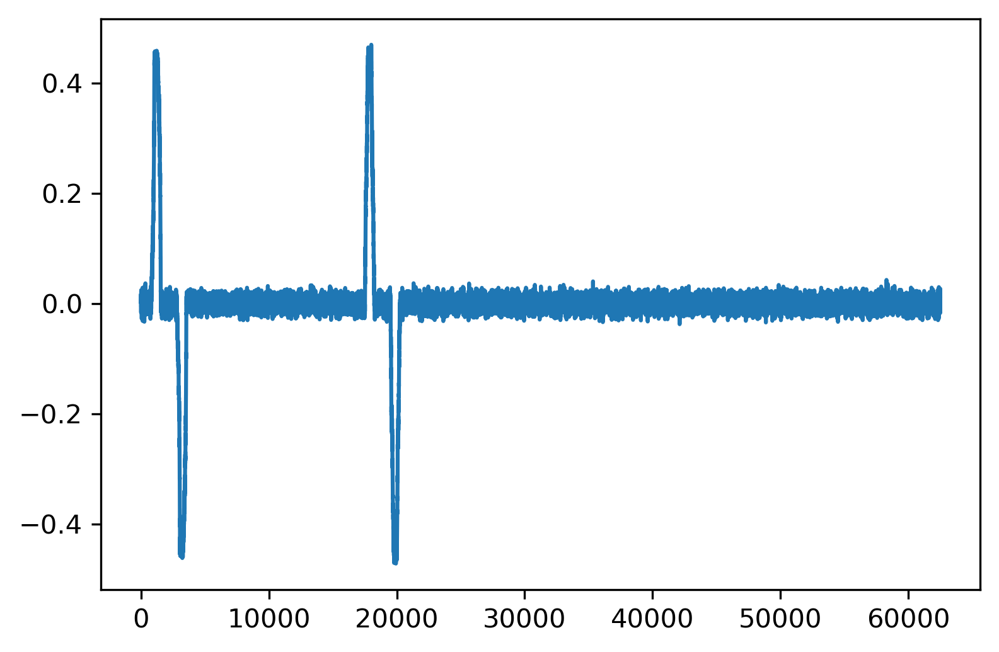

In [342]:
plt.plot(np.gradient(trapezoid_filter(data[i], 500, 1500, 15000)))

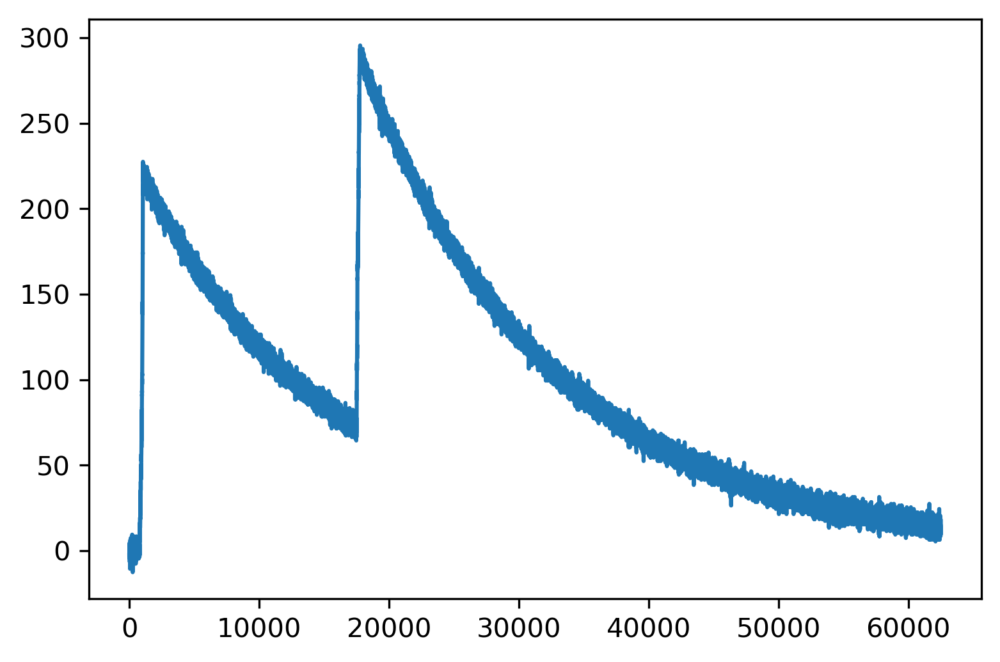

In [242]:
plt.plot(reset_zero(data[1]))

In [354]:
st = time.time()
trapezoid_filter(data[1], 1000, 3000, 15000)
print(time.time()-st)


st = time.time()
(1/500)*s(od, determine_rise(od), 15000, 1000, 3000)
print(time.time()-st)

0.004949092864990234
0.007200002670288086


In [2]:
data, saturated = import_data('../Lab-1/Data/Combined_Data/Cs137-24in-2.h5')

Checking for Saturation:   0%|          | 0/16145 [00:00<?, ?it/s]

In [3]:
old_energies = calibrate_pulses(data, calibrated=False, new_trapezoid=False)
new_energies = calibrate_pulses(data, calibrated=False)

Creating spectra:   0%|          | 0/16145 [00:00<?, ?it/s]

Using old trapezoid filtering technique


Creating spectra:   0%|          | 0/16145 [00:00<?, ?it/s]

Using new trapezoid filtering technique


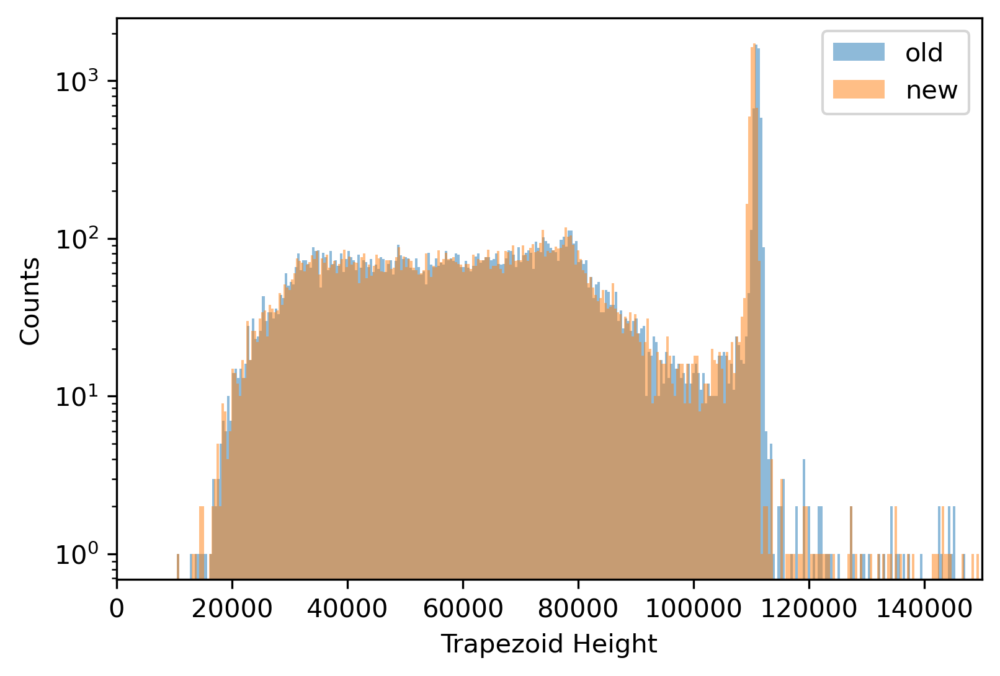

In [8]:
plt.hist(old_energies, bins=2**10, alpha=0.5, label='old')
plt.hist(new_energies, bins=2**10, alpha=0.5, label='new')
plt.legend()
plt.semilogy()
plt.xlim(0, 1.5e5)
plt.xlabel('Trapezoid Height')
plt.ylabel('Counts')
plt.show()

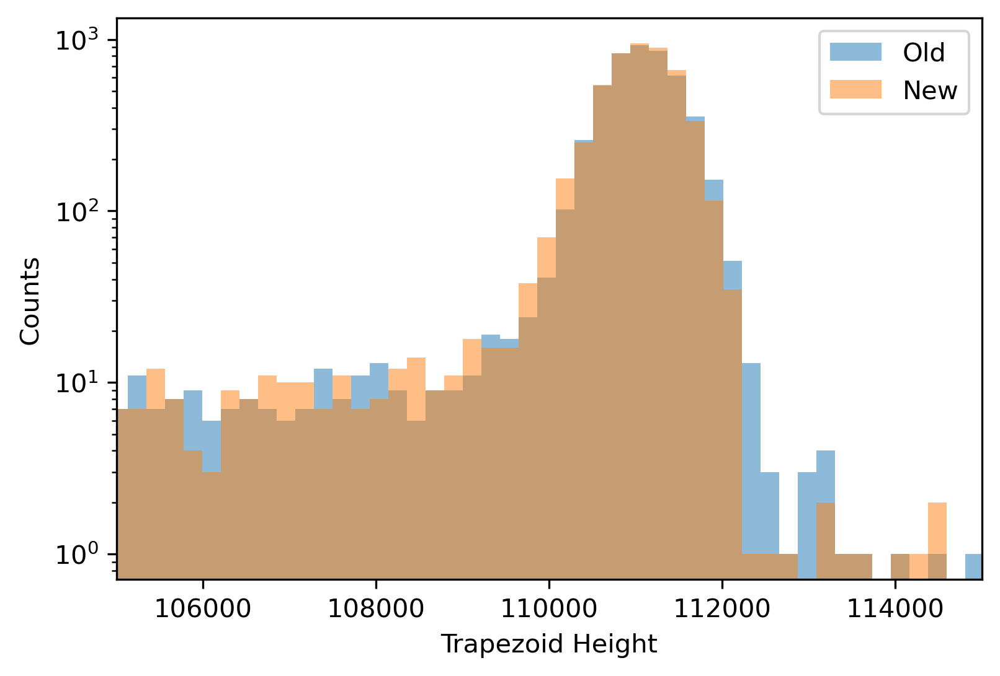

In [22]:
bins_ = np.linspace(np.min(old_energies), np.max(new_energies), 2**11+1)

plt.hist(old_energies, bins=bins_, alpha=0.5, label='Old')
plt.hist(new_energies+765, bins=bins_, alpha=0.5, label='New')
plt.xlim(1.05e5, 1.15e5)
plt.semilogy()
plt.xlabel('Trapezoid Height')
plt.ylabel('Counts')
plt.legend()
plt.show()

In [89]:
test = [np.array([0]), 1]

In [94]:
type(test[0]) == np.ndarray

True

In [107]:
import_data

<function NE204_Functions.import_data(datafile, adc_max=16383)>

In [2]:
data, sat = import_data('../Lab-1/Data/Combined_Data/Cs137-24in-2.h5'); label = 'Cs137'
#data, sat = import_data('../Lab-1/Data/Combined_Data/Co60-36in-2.h5'); label = 'Co60'
#data, sat = import_data('../Lab-1/Data/Combined_Data/Eu152-24in-5.h5'); label = 'Eu152'
#data, sat = import_data('../Lab-1/Data/Combined_Data/Th228-24in-60.h5'); label = 'Th228'
#data, sat = import_data('../Lab-1/Data/Combined_Data/Co57-4in-2.h5'); label = 'Co57'
#back, sat = import_data('../Lab-1/Data/Combined_Data/Background-60.h5'); label = 'Background'

Checking for Saturation:   0%|          | 0/16145 [00:00<?, ?it/s]

In [3]:
energies, indexes = calibrate_pulses(data, return_inds=True, save_file='{}-Cal'.format(label),
                                    multipulse_rejection=True)
np.save('../Lab-1/Data/Trapezoid_Heights/New/{}-indexes.npy'.format(label), indexes)

Detecting Pileup:   0%|          | 0/16145 [00:00<?, ?it/s]

Creating spectra:   0%|          | 0/16145 [00:00<?, ?it/s]

Saving trapezoid heights


In [80]:
energy_calibrations_new = {'Energies': np.array([0, 661.657, 1173.228, 1332.492, 121.782, 244.697, 
                                                 344.279, 778.905, 1408.013, 2614.511]),
                      'Trapezoid Heights': np.array([0, 220.408, 390.787, 444.141, 40.911, 81.656, 
                                                     114.791, 259.693, 469.777, 872.257]),
                      'Sigmas': np.array([0, 0.857, 1.118, 1.161, 0.631, 0.665, 0.708, 0.909, 1.372, 1.741])}

In [94]:
new_calib_const = np.load('calibration_values_new.npy')

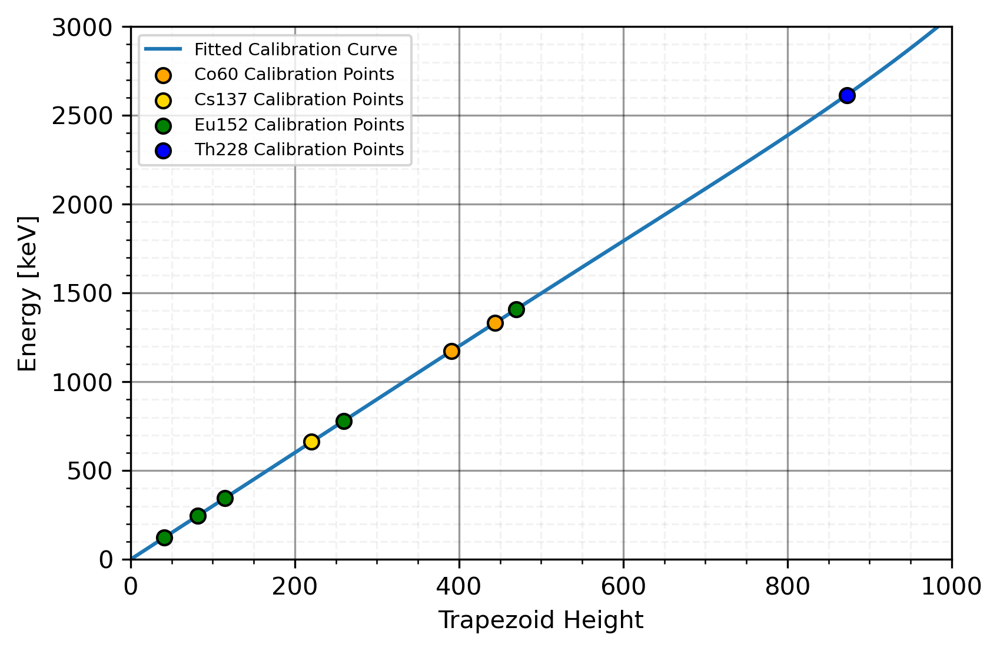

In [95]:
plt.plot(calibrate_energy(np.arange(1000),*new_calib_const), label='Fitted Calibration Curve')#, zorder=-1)
plt.scatter(energy_calibrations_new['Trapezoid Heights'][[2,3]], energy_calibrations_new['Energies'][[2,3]], 
            label='Co60 Calibration Points', color=source_colors['Co60'], zorder=5, edgecolor='black')
plt.scatter(energy_calibrations_new['Trapezoid Heights'][[1]], energy_calibrations_new['Energies'][[1]], 
            label='Cs137 Calibration Points', color=source_colors['Cs137'], zorder=5, edgecolor='black')
plt.scatter(energy_calibrations_new['Trapezoid Heights'][[4,5,6,7,8]], energy_calibrations_new['Energies'][[4,5,6,7,8]], 
            label='Eu152 Calibration Points', color=source_colors['Eu152'], zorder=5, edgecolor='black')
plt.scatter(energy_calibrations_new['Trapezoid Heights'][[9]], energy_calibrations_new['Energies'][[9]], 
            label='Th228 Calibration Points', color=source_colors['Th228'], zorder=5, edgecolor='black')
plt.xlim(0,1000)
plt.ylim(0,3000)
plt.legend(fontsize=7)
plt.grid(which='major', color='k', linestyle='-', alpha=0.4)
plt.minorticks_on()
plt.grid(which='minor', color='k', linestyle='--', alpha=0.05)
plt.xlabel("Trapezoid Height")
plt.ylabel('Energy [keV]')
plt.savefig('Plots/calibration_curve_new.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()